## Mini Project 2 - Food Access for Seniors in the US

### Project Summary
- This project aims to provide a guide to national, state and local governments on where to allocate funds to improve food access for seniors in the US.
- The project will use data from the USDA Food Access Research Atlas and analyze by county where the highest opportunity exists for spending on infrastructure to improve food access for seniors.

### Data Source
- USDA Food Access Research Atlas: https://www.ers.usda.gov/data-products/food-access-research-atlas/download-the-data/
- The data is available in CSV format and includes information on food access and food access metrics at the county level for the entire US.


### 1. Exploratory Data Analysis

#### Before Import:
- Data was in a table look-up format
- Had to convert the file to CSV, then open it in text editor and remove the first 'Table' line, then save as CSV

In [191]:
#Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [192]:
#Import Dataset
food = pd.read_csv('/Users/jasonohara/Desktop/DATA SCIENCE/MINI-PROJECT_2/DATASETS/CSV-Converted Files for Main Data/FoodAccessResearchAtlasData2019 2/Food Access Research Atlas-Table 1.csv')
food.head()

,CensusTract,State,County,Urban,Pop2010,OHU2010,GroupQuartersFlag,NUMGQTRS,PCTGQTRS,LILATracts_1And10,...,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,1001020100,Alabama,Autauga County,1,1912,693,0,0.0,0.00,0,...,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0,102.0
1,1001020200,Alabama,Autauga County,1,2170,743,0,181.0,8.34,1,...,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0,156.0
2,1001020300,Alabama,Autauga County,1,3373,1256,0,0.0,0.00,0,...,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0,172.0
3,1001020400,Alabama,Autauga County,1,4386,1722,0,0.0,0.00,0,...,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0,98.0
4,1001020500,Alabama,Autauga County,1,10766,4082,0,181.0,1.68,0,...,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0,339.0


In [193]:
#Convert to DataFrame
food = pd.DataFrame(food)

In [194]:
#Look at the firt 5 rows of the dataset"
food.head()

,CensusTract,State,County,Urban,Pop2010,OHU2010,GroupQuartersFlag,NUMGQTRS,PCTGQTRS,LILATracts_1And10,...,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV,TractSNAP
0,1001020100,Alabama,Autauga County,1,1912,693,0,0.0,0.00,0,...,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0,102.0
1,1001020200,Alabama,Autauga County,1,2170,743,0,181.0,8.34,1,...,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0,156.0
2,1001020300,Alabama,Autauga County,1,3373,1256,0,0.0,0.00,0,...,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0,172.0
3,1001020400,Alabama,Autauga County,1,4386,1722,0,0.0,0.00,0,...,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0,98.0
4,1001020500,Alabama,Autauga County,1,10766,4082,0,181.0,1.68,0,...,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0,339.0


In [195]:
#Get the shape of the dataset
food.shape

(72531, 147)

In [196]:
#Look at the data types
food.dtypes

CensusTract        int64
State             object
County            object
Urban              int64
Pop2010            int64
                  ...   
TractAIAN        float64
TractOMultir     float64
TractHispanic    float64
TractHUNV        float64
TractSNAP        float64
Length: 147, dtype: object

In [197]:
#View columns that are an 'object' data type
food.select_dtypes('object').columns


Index(['State', 'County'], dtype='object')

In [198]:
#Drop the CensusTract column
food = food.drop(['CensusTract'], axis=1)

In [199]:
#View column names
food.columns

Index(['State', 'County', 'Urban', 'Pop2010', 'OHU2010', 'GroupQuartersFlag',
       'NUMGQTRS', 'PCTGQTRS', 'LILATracts_1And10', 'LILATracts_halfAnd10',
       ...
       'TractSeniors', 'TractWhite', 'TractBlack', 'TractAsian', 'TractNHOPI',
       'TractAIAN', 'TractOMultir', 'TractHispanic', 'TractHUNV', 'TractSNAP'],
      dtype='object', length=146)

In [200]:
#Import Lookup Table as 'definitions'
definitions = pd.read_csv('/Users/jasonohara/Desktop/DATA SCIENCE/MINI-PROJECT_2/DATASETS/CSV-Converted Files for Main Data/FoodAccessResearchAtlasData2019 2/Variable Lookup-Table 1.csv')

In [201]:
#convert 'definitions' to a DataFrame
definitions = pd.DataFrame(definitions)

In [202]:
definitions.head()

,,,,Table 1
Field,LongName,Description,NaN,NaN
CensusTract,Census tract,Census tract number,NaN,NaN
State,State,State name,NaN,NaN
County,County,County name,NaN,NaN
Urban,Urban tract,Flag for urban tract,NaN,NaN


In [203]:
definitions

,,,,Table 1
Field,LongName,Description,NaN,NaN
CensusTract,Census tract,Census tract number,NaN,NaN
State,State,State name,NaN,NaN
County,County,County name,NaN,NaN
Urban,Urban tract,Flag for urban tract,NaN,NaN
...,...,...,...,...
TractAIAN,"Tract American Indian and Alaska Native population, number",Total count of American Indian and Alaska Native population in tract,NaN,NaN
TractOMultir,"Tract Other/Multiple race population, number",Total count of Other/Multiple race population in tract,NaN,NaN
TractHispanic,"Tract Hispanic or Latino population, number",Total count of Hispanic or Latino population in tract,NaN,NaN
TractHUNV,"Tract housing units without a vehicle, number",Total count of housing units without a vehicle in tract,NaN,NaN


## Initial Data Analysis
- Working with a dataset that contains low food access points measured at over .5, 1, 10, & 20 miles (distance from supermarket).
- Other factors are included such as race, children, income, housing, vehicle access, government benefits, etc.
- Data is grouped by census tract, but I'll be grouping by state and county for this study, so dropped that column.
- Visualization is not helpful at this stage. Data needs to be cleaned & columns reduced first.

### 2. Data Cleaning
- Remove columns that pertain to kids or children (we're focused on seniors here).
- Remove columns pertaining to government benefits (already have income and poverty flags).
- Study will be irrespective of group housing, so will remove those columns.

In [204]:
#Create a working copy of the food dataset
food_clean = food.copy()


In [205]:
#Using the new dataset, 'food_clean', drop the columns that pertain to kids
#Drop columns that have kids in the column name
food_clean = food_clean.drop(food_clean.columns[food_clean.columns.str.contains('kids', case=False)], axis=1)

In [206]:
#Drop columns that have children in the column name
food_clean = food_clean.drop(food_clean.columns[food_clean.columns.str.contains('children', case=False)], axis=1)

In [207]:
#Drop columns that have snap in the column name
food_clean = food_clean.drop(food_clean.columns[food_clean.columns.str.contains('SNAP', case=False)], axis=1)

In [208]:
#Drop the following columns: 'GroupQuartersFlag', 'NUMGQTRS', 'PCTGQTRS'
food_clean = food_clean.drop(['GroupQuartersFlag', 'NUMGQTRS', 'PCTGQTRS'], axis=1)

In [209]:
food_clean.shape

(72531, 125)

In [210]:
#Look for columns that have missing values
food_clean.isnull().sum()


State            0
County           0
Urban            0
Pop2010          0
OHU2010          0
                ..
TractNHOPI       4
TractAIAN        4
TractOMultir     4
TractHispanic    4
TractHUNV        4
Length: 125, dtype: int64

### Take a look at a smaller sub-set of the data to help visualize...
- Let's look at the data within the 1/2 mile access point for population, income, seniors and race

In [211]:
#Create a new dataset 'food_clean_test' using all columns with half in the name
food_clean_test = food_clean[food_clean.columns[food_clean.columns.str.contains('half', case=False)]]
food_clean_test.head()


,LILATracts_halfAnd10,LAhalfand10,LATracts_half,lapophalf,lapophalfshare,lalowihalf,lalowihalfshare,laseniorshalf,laseniorshalfshare,lawhitehalf,...,lanhopihalf,lanhopihalfshare,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare
0,0,1,1,1912.0,100.00,467.0,24.42,221.0,11.56,1622.0,...,0.0,0.00,14.0,0.73,45.0,2.35,44.0,2.30,5.0,0.79
1,1,1,1,2170.0,100.00,962.0,44.34,214.0,9.86,888.0,...,0.0,0.00,5.0,0.23,55.0,2.53,75.0,3.46,93.0,12.47
2,0,1,1,2857.0,84.70,971.0,28.79,358.0,10.60,2177.0,...,1.0,0.03,10.0,0.30,105.0,3.10,78.0,2.30,39.0,3.09
3,0,1,1,3651.0,83.24,893.0,20.36,767.0,17.48,3395.0,...,3.0,0.06,8.0,0.18,60.0,1.38,61.0,1.40,19.0,1.13
4,0,1,1,7778.0,72.25,1719.0,15.97,840.0,7.80,6299.0,...,5.0,0.05,38.0,0.35,227.0,2.11,277.0,2.57,164.0,4.01


In [212]:
#Drop the following columns: 'LILATracts_halfAnd10', 'LAhalfand10', 'LATracts_half'
food_clean_test = food_clean_test.drop(['LILATracts_halfAnd10', 'LAhalfand10', 'LATracts_half'], axis=1)

In [213]:
food_clean_test.head()


,lapophalf,lapophalfshare,lalowihalf,lalowihalfshare,laseniorshalf,laseniorshalfshare,lawhitehalf,lawhitehalfshare,lablackhalf,lablackhalfshare,...,lanhopihalf,lanhopihalfshare,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare
0,1912.0,100.00,467.0,24.42,221.0,11.56,1622.0,84.83,217.0,11.35,...,0.0,0.00,14.0,0.73,45.0,2.35,44.0,2.30,5.0,0.79
1,2170.0,100.00,962.0,44.34,214.0,9.86,888.0,40.92,1217.0,56.08,...,0.0,0.00,5.0,0.23,55.0,2.53,75.0,3.46,93.0,12.47
2,2857.0,84.70,971.0,28.79,358.0,10.60,2177.0,64.53,554.0,16.43,...,1.0,0.03,10.0,0.30,105.0,3.10,78.0,2.30,39.0,3.09
3,3651.0,83.24,893.0,20.36,767.0,17.48,3395.0,77.41,170.0,3.88,...,3.0,0.06,8.0,0.18,60.0,1.38,61.0,1.40,19.0,1.13
4,7778.0,72.25,1719.0,15.97,840.0,7.80,6299.0,58.51,1001.0,9.29,...,5.0,0.05,38.0,0.35,227.0,2.11,277.0,2.57,164.0,4.01


In [214]:
#Add State and County columns to the 'food_clean_test' dataset
food_clean_test['State'] = food['State']
food_clean_test['County'] = food['County']
food_clean_test.head()

,lapophalf,lapophalfshare,lalowihalf,lalowihalfshare,laseniorshalf,laseniorshalfshare,lawhitehalf,lawhitehalfshare,lablackhalf,lablackhalfshare,...,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare,State,County
0,1912.0,100.00,467.0,24.42,221.0,11.56,1622.0,84.83,217.0,11.35,...,14.0,0.73,45.0,2.35,44.0,2.30,5.0,0.79,Alabama,Autauga County
1,2170.0,100.00,962.0,44.34,214.0,9.86,888.0,40.92,1217.0,56.08,...,5.0,0.23,55.0,2.53,75.0,3.46,93.0,12.47,Alabama,Autauga County
2,2857.0,84.70,971.0,28.79,358.0,10.60,2177.0,64.53,554.0,16.43,...,10.0,0.30,105.0,3.10,78.0,2.30,39.0,3.09,Alabama,Autauga County
3,3651.0,83.24,893.0,20.36,767.0,17.48,3395.0,77.41,170.0,3.88,...,8.0,0.18,60.0,1.38,61.0,1.40,19.0,1.13,Alabama,Autauga County
4,7778.0,72.25,1719.0,15.97,840.0,7.80,6299.0,58.51,1001.0,9.29,...,38.0,0.35,227.0,2.11,277.0,2.57,164.0,4.01,Alabama,Autauga County


In [215]:
#Move the 'State' and 'County' columns to the front of the dataset
cols = food_clean_test.columns.tolist()
cols = cols[-2:] + cols[:-2]
food_clean_test = food_clean_test[cols]
food_clean_test.head()

,State,County,lapophalf,lapophalfshare,lalowihalf,lalowihalfshare,laseniorshalf,laseniorshalfshare,lawhitehalf,lawhitehalfshare,...,lanhopihalf,lanhopihalfshare,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare
0,Alabama,Autauga County,1912.0,100.00,467.0,24.42,221.0,11.56,1622.0,84.83,...,0.0,0.00,14.0,0.73,45.0,2.35,44.0,2.30,5.0,0.79
1,Alabama,Autauga County,2170.0,100.00,962.0,44.34,214.0,9.86,888.0,40.92,...,0.0,0.00,5.0,0.23,55.0,2.53,75.0,3.46,93.0,12.47
2,Alabama,Autauga County,2857.0,84.70,971.0,28.79,358.0,10.60,2177.0,64.53,...,1.0,0.03,10.0,0.30,105.0,3.10,78.0,2.30,39.0,3.09
3,Alabama,Autauga County,3651.0,83.24,893.0,20.36,767.0,17.48,3395.0,77.41,...,3.0,0.06,8.0,0.18,60.0,1.38,61.0,1.40,19.0,1.13
4,Alabama,Autauga County,7778.0,72.25,1719.0,15.97,840.0,7.80,6299.0,58.51,...,5.0,0.05,38.0,0.35,227.0,2.11,277.0,2.57,164.0,4.01


In [216]:
#Group by 'State' and 'County' and sum the values
food_clean_test = food_clean_test.groupby(['State', 'County']).sum()
food_clean_test.head()

lapophalf  lapophalfshare  lalowihalf  \
State   County                                                  
Alabama Autauga County    49497.0         1116.10     15518.0   
        Baldwin County   165616.0         2828.41     48117.0   
        Barbour County    23762.0          771.15     11901.0   
        Bibb County       20989.0          376.22      8349.0   
        Blount County     54933.0          861.93     19806.0   

                        lalowihalfshare  laseniorshalf  laseniorshalfshare  \
State   County                                                               
Alabama Autauga County           383.91         5935.0              136.91   
        Baldwin County           848.82        27241.0              489.70   
        Barbour County           385.22         3348.0              116.79   
        Bibb County              141.76         2630.0               48.02   
        Blount County            313.84         7810.0              123.27   

                        lawhitehalf  lawhitehalfshare  lablackhalf  \
State   County                                                       
Alabama Autauga County      38699.0            838.70       8987.0   
        Baldwin County     142534.0           2440.10      14958.0   
        Barbour County      11829.0            386.57      10675.0   
        Bibb County         16162.0            303.83       4361.0   
        Blount County       50968.0            799.95        716.0   

                        lablackhalfshare  ...  lanhopihalf  lanhopihalfshare  \
State   County                            ...                                  
Alabama Autauga County            238.45  ...         23.0              0.39   
        Baldwin County            257.11  ...         83.0              1.27   
        Barbour County            348.69  ...         29.0              0.65   
        Bibb County                64.18  ...         13.0              0.15   
        Blount County               9.61  ...         38.0              0.56   

                        laaianhalf  laaianhalfshare  laomultirhalf  \
State   County                                                       
Alabama Autauga County       216.0             5.00         1200.0   
        Baldwin County      1135.0            21.90         5757.0   
        Barbour County       109.0             3.42         1047.0   
        Bibb County           60.0             1.16          371.0   
        Blount County        296.0             4.48         2809.0   

                        laomultirhalfshare  lahisphalf  lahisphalfshare  \
State   County                                                            
Alabama Autauga County               27.79      1166.0            26.96   
        Baldwin County               91.10      7321.0           107.89   
        Barbour County               29.44      1272.0            35.84   
        Bibb County                   6.57       379.0             7.21   
        Blount County                45.78      4262.0            68.95   

                        lahunvhalf  lahunvhalfshare  
State   County                                       
Alabama Autauga County      1045.0            66.57  
        Baldwin County      2178.0           101.41  
        Barbour County       742.0            69.97  
        Bibb County          441.0            25.93  
        Blount County        822.0            34.71  

[5 rows x 22 columns]

In [217]:
#Check for missing values
food_clean_test.isnull().sum()

lapophalf             0
lapophalfshare        0
lalowihalf            0
lalowihalfshare       0
laseniorshalf         0
laseniorshalfshare    0
lawhitehalf           0
lawhitehalfshare      0
lablackhalf           0
lablackhalfshare      0
laasianhalf           0
laasianhalfshare      0
lanhopihalf           0
lanhopihalfshare      0
laaianhalf            0
laaianhalfshare       0
laomultirhalf         0
laomultirhalfshare    0
lahisphalf            0
lahisphalfshare       0
lahunvhalf            0
lahunvhalfshare       0
dtype: int64

In [218]:
#Look at the correlation between the columns
correlation = food_clean_test.corr()

In [219]:
correlation

,lapophalf,lapophalfshare,lalowihalf,lalowihalfshare,laseniorshalf,laseniorshalfshare,lawhitehalf,lawhitehalfshare,lablackhalf,lablackhalfshare,...,lanhopihalf,lanhopihalfshare,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare
lapophalf,1.000000,0.986773,0.961187,0.940793,0.968200,0.941504,0.978495,0.966234,0.741838,0.686562,...,0.319717,0.311966,0.421972,0.395543,0.859722,0.857092,0.817388,0.823916,0.899272,0.839512
lapophalfshare,0.986773,1.000000,0.951426,0.961188,0.971517,0.967423,0.964387,0.976313,0.750070,0.724513,...,0.311745,0.309293,0.420970,0.406324,0.836880,0.849794,0.782825,0.803771,0.925431,0.887372
lalowihalf,0.961187,0.951426,1.000000,0.980050,0.919384,0.900751,0.920089,0.909024,0.775482,0.724423,...,0.284455,0.277539,0.446610,0.420646,0.873109,0.868752,0.866755,0.867225,0.896387,0.849781
lalowihalfshare,0.940793,0.961188,0.980050,1.000000,0.917167,0.923467,0.899374,0.913605,0.797602,0.786595,...,0.264474,0.263396,0.436942,0.425124,0.826257,0.839315,0.800565,0.817854,0.930623,0.913006
laseniorshalf,0.968200,0.971517,0.919384,0.917167,1.000000,0.987490,0.966099,0.969756,0.693078,0.659469,...,0.303011,0.298047,0.396681,0.379921,0.792467,0.799451,0.745650,0.760780,0.901871,0.847056
laseniorshalfshare,0.941504,0.967423,0.900751,0.923467,0.987490,1.000000,0.938295,0.964009,0.689106,0.678959,...,0.286459,0.285637,0.394301,0.387708,0.765381,0.783584,0.713123,0.738349,0.904341,0.869054
lawhitehalf,0.978495,0.964387,0.920089,0.899374,0.966099,0.938295,1.000000,0.987489,0.647259,0.599012,...,0.268430,0.259541,0.400825,0.378930,0.783595,0.780687,0.757670,0.761337,0.867507,0.798634
lawhitehalfshare,0.966234,0.976313,0.909024,0.913605,0.969756,0.964009,0.987489,1.000000,0.639680,0.611939,...,0.267286,0.262942,0.403723,0.392508,0.771823,0.782756,0.733186,0.750668,0.880826,0.828204
lablackhalf,0.741838,0.750070,0.775482,0.797602,0.693078,0.689106,0.647259,0.639680,1.000000,0.968817,...,0.130779,0.132071,0.220049,0.200225,0.541717,0.543426,0.519619,0.522643,0.826726,0.820887
lablackhalfshare,0.686562,0.724513,0.724423,0.786595,0.659469,0.678959,0.599012,0.611939,0.968817,1.000000,...,0.111112,0.117057,0.196096,0.187280,0.466177,0.481974,0.433794,0.447509,0.834648,0.866673


<Axes: >

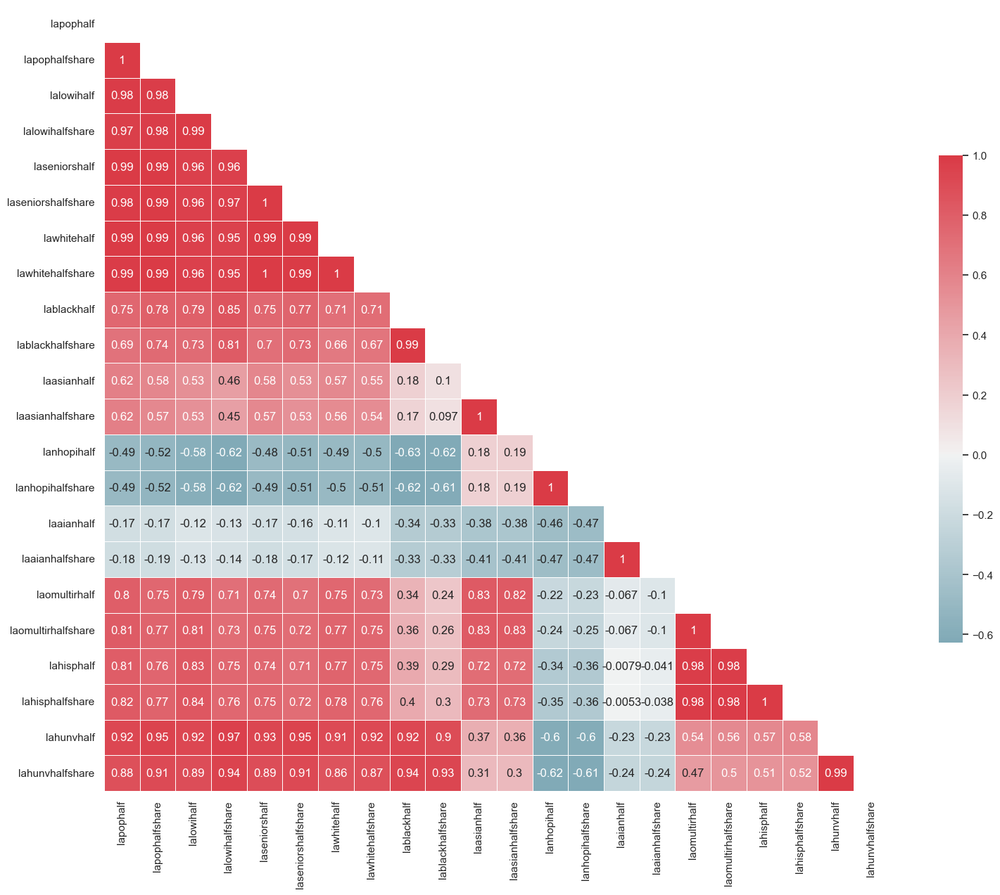

In [220]:
#Look at the correlation between the columns, using a heatmap
sns.set(style="white")
# Generate a mask for the upper triangle
mask = np.zeros_like(correlation.corr())
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

### Still not giving me what I need, so I'm going to go back to the main dataset and parse it out into 4 different databases for PCA analysis.
- Start with same parameters of food_clean. (Removing kids, SNAP and group housing)
- Will breakdown by distance from supermarket (.5, 1, 10, 20 miles)
- Group by state & county, then sum numerical columns
- Result will be 4 different databases to run model on and help reduce features.

In [221]:
#Create a copy of food_clean dataset
food_clean2 = food_clean.copy()
food_clean2.head()

,State,County,Urban,Pop2010,OHU2010,LILATracts_1And10,LILATracts_halfAnd10,LILATracts_1And20,LILATracts_Vehicle,HUNVFlag,...,TractLOWI,TractSeniors,TractWhite,TractBlack,TractAsian,TractNHOPI,TractAIAN,TractOMultir,TractHispanic,TractHUNV
0,Alabama,Autauga County,1,1912,693,0,0,0,0,0,...,455.0,221.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,6.0
1,Alabama,Autauga County,1,2170,743,1,1,1,0,0,...,802.0,214.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,89.0
2,Alabama,Autauga County,1,3373,1256,0,0,0,0,0,...,1306.0,439.0,2576.0,647.0,17.0,5.0,11.0,117.0,87.0,99.0
3,Alabama,Autauga County,1,4386,1722,0,0,0,0,0,...,922.0,904.0,4086.0,193.0,18.0,4.0,11.0,74.0,85.0,21.0
4,Alabama,Autauga County,1,10766,4082,0,0,0,0,1,...,2242.0,1126.0,8666.0,1437.0,296.0,9.0,48.0,310.0,355.0,230.0


In [222]:
#Groupd by 'State' and 'County' and sum the values
food_clean2 = food_clean2.groupby(['State', 'County']).sum()

In [223]:
food_clean2.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  TractLOWI  TractSeniors  TractWhite  \
State   County                       ...                                        
Alabama Autauga County        193.5  ...    17243.0        6546.0     42855.0   
        Baldwin County        367.2  ...    57843.0       30568.0    156153.0   
        Barbour County        263.8  ...    12073.0        3909.0     13180.0   
        Bibb County            48.7  ...     7968.0        2906.0     17381.0   
        Blount County         133.7  ...    20795.0        8439.0     53068.0   

                        TractBlack  TractAsian  TractNHOPI  TractAIAN  \
State   County                                                          
Alabama Autauga County      9643.0       474.0        32.0      232.0   
        Baldwin County     17105.0      1348.0        89.0     1216.0   
        Barbour County     12875.0       107.0        29.0      114.0   
        Bibb County         5047.0        22.0        13.0       64.0   
        Blount County        761.0       117.0        38.0      307.0   

                        TractOMultir  TractHispanic  TractHUNV  
State   County                                                  
Alabama Autauga County        1335.0         1310.0     1191.0  
        Baldwin County        6354.0         7992.0     2705.0  
        Barbour County        1152.0         1387.0      849.0  
        Bibb County            388.0          406.0      410.0  
        Blount County         3031.0         4626.0      856.0  

[5 rows x 123 columns]

In [224]:
#Look at the shape of the dataset
food_clean2.shape

(3142, 123)

In [225]:
#Look for missing values
food_clean2.isnull().sum()

Urban                   0
Pop2010                 0
OHU2010                 0
LILATracts_1And10       0
LILATracts_halfAnd10    0
                       ..
TractNHOPI              0
TractAIAN               0
TractOMultir            0
TractHispanic           0
TractHUNV               0
Length: 123, dtype: int64

In [226]:
#using column names, create a new dataset 'food_test_1' that contains the range of columns from 'Urban' to 'lahunvhalfshare'
food_test_1 = food_clean2.loc[:, 'Urban':'lahunvhalfshare']
food_test_1.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lanhopihalf  lanhopihalfshare  \
State   County                       ...                                  
Alabama Autauga County        193.5  ...         23.0              0.39   
        Baldwin County        367.2  ...         83.0              1.27   
        Barbour County        263.8  ...         29.0              0.65   
        Bibb County            48.7  ...         13.0              0.15   
        Blount County         133.7  ...         38.0              0.56   

                        laaianhalf  laaianhalfshare  laomultirhalf  \
State   County                                                       
Alabama Autauga County       216.0             5.00         1200.0   
        Baldwin County      1135.0            21.90         5757.0   
        Barbour County       109.0             3.42         1047.0   
        Bibb County           60.0             1.16          371.0   
        Blount County        296.0             4.48         2809.0   

                        laomultirhalfshare  lahisphalf  lahisphalfshare  \
State   County                                                            
Alabama Autauga County               27.79      1166.0            26.96   
        Baldwin County               91.10      7321.0           107.89   
        Barbour County               29.44      1272.0            35.84   
        Bibb County                   6.57       379.0             7.21   
        Blount County                45.78      4262.0            68.95   

                        lahunvhalf  lahunvhalfshare  
State   County                                       
Alabama Autauga County      1045.0            66.57  
        Baldwin County      2178.0           101.41  
        Barbour County       742.0            69.97  
        Bibb County          441.0            25.93  
        Blount County        822.0            34.71  

[5 rows x 47 columns]

In [227]:
#Using column names, create a new dataset 'food_test_2' that contains the range of columns from 'Urban' to 'LALOWI1_20'
food_test_2 = food_clean2.loc[:, 'Urban':'LALOWI1_20']
#Append the range of columns from 'lapop1' to 'lahunv1share' to the end of 'food_test_2'
food_test_2 = food_test_2.join(food_clean2.loc[:, 'lapop1':'lahunv1share'])
food_test_2.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lanhopi1  lanhopi1share  laaian1  \
State   County                       ...                                     
Alabama Autauga County        193.5  ...      16.0           0.29    171.0   
        Baldwin County        367.2  ...      51.0           0.71    974.0   
        Barbour County        263.8  ...      12.0           0.28    101.0   
        Bibb County            48.7  ...       6.0           0.06     52.0   
        Blount County         133.7  ...      36.0           0.54    271.0   

                        laaian1share  laomultir1  laomultir1share  lahisp1  \
State   County                                                               
Alabama Autauga County          4.22       901.0            22.31    800.0   
        Baldwin County         19.47      4695.0            76.57   5695.0   
        Barbour County          3.07       889.0            25.13   1044.0   
        Bibb County             1.06       288.0             5.57    268.0   
        Blount County           4.10      2414.0            39.82   3602.0   

                        lahisp1share  lahunv1  lahunv1share  
State   County                                               
Alabama Autauga County         19.91    834.0         55.32  
        Baldwin County         86.18   1653.0         80.79  
        Barbour County         29.80    545.0         50.43  
        Bibb County             5.88    312.0         21.08  
        Blount County          58.70    752.0         31.88  

[5 rows x 47 columns]

In [228]:
#Using column names, create a new dataset 'food_test_3' that contains the range of columns from 'Urban' to 'LALOWI1_20'
food_test_3 = food_clean2.loc[:, 'Urban':'LALOWI1_20']
#Append the range of columns from 'lapop10' to 'lahunv10share' to the end of 'food_test_3'
food_test_3 = food_test_3.join(food_clean2.loc[:, 'lapop10':'lahunv10share'])
food_test_3.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lanhopi10  lanhopi10share  laaian10  \
State   County                       ...                                        
Alabama Autauga County        193.5  ...        0.0            0.00      21.0   
        Baldwin County        367.2  ...        0.0            0.00      36.0   
        Barbour County        263.8  ...        3.0            0.06      12.0   
        Bibb County            48.7  ...        0.0            0.00       1.0   
        Blount County         133.7  ...        0.0            0.00       0.0   

                        laaian10share  laomultir10  laomultir10share  \
State   County                                                         
Alabama Autauga County           0.72         88.0              2.82   
        Baldwin County           0.87         34.0              0.71   
        Barbour County           0.46        400.0             10.44   
        Bibb County              0.03          3.0              0.06   
        Blount County            0.00          0.0              0.00   

                        lahisp10  lahisp10share  lahunv10  lahunv10share  
State   County                                                            
Alabama Autauga County      67.0           2.10     222.0          16.93  
        Baldwin County      17.0           0.35      32.0           2.13  
        Barbour County     426.0          10.82     201.0          18.91  
        Bibb County          3.0           0.05       0.0           0.04  
        Blount County        0.0           0.00       0.0           0.00  

[5 rows x 47 columns]

In [229]:
#using column names, create a new dataset 'food_test_4' that contains the range of columns from 'Urban' to 'LALOWI1_20'
food_test_4 = food_clean2.loc[:, 'Urban':'LALOWI1_20']
#Append the range of columns from 'lapop20' to 'lahunv20share' to the end of 'food_test_4'
food_test_4 = food_test_4.join(food_clean2.loc[:, 'lapop20':'lahunv20share'])
food_test_4.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lanhopi20  lanhopi20share  laaian20  \
State   County                       ...                                        
Alabama Autauga County        193.5  ...        0.0             0.0       0.0   
        Baldwin County        367.2  ...        0.0             0.0       0.0   
        Barbour County        263.8  ...        0.0             0.0       0.0   
        Bibb County            48.7  ...        0.0             0.0       0.0   
        Blount County         133.7  ...        0.0             0.0       0.0   

                        laaian20share  laomultir20  laomultir20share  \
State   County                                                         
Alabama Autauga County            0.0          0.0               0.0   
        Baldwin County            0.0          0.0               0.0   
        Barbour County            0.0          0.0               0.0   
        Bibb County               0.0          0.0               0.0   
        Blount County             0.0          0.0               0.0   

                        lahisp20  lahisp20share  lahunv20  lahunv20share  
State   County                                                            
Alabama Autauga County       0.0            0.0       0.0            0.0  
        Baldwin County       0.0            0.0       0.0            0.0  
        Barbour County       0.0            0.0       0.0            0.0  
        Bibb County          0.0            0.0       0.0            0.0  
        Blount County        0.0            0.0       0.0            0.0  

[5 rows x 47 columns]

### Preprocessing
- Start PCA Analysis on the first dataset: food_test_1

In [230]:
#Import the necessary libraries for KMeans, StandardScaler, and PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [231]:
#Create a list with the number of k-values to try
k_values = list(range(1, 11))

In [232]:
#Create an empty list to store the inertia values
inertia_values = []

In [233]:
#Create a for loop to find the inertia values for each k-value
for k in k_values:
    #Create a KMeans model with the current k-value
    kmeans = KMeans(n_clusters=k)
    #Fit the model to the data
    kmeans.fit(food_test_1)
    #Append the inertia value to the list
    inertia_values.append(kmeans.inertia_)

In [234]:
#Create a dictionary with the data to plot the elbow curve
elbow_data = {"k": k_values, "inertia": inertia_values}

#Create a DataFrame with the data to plot the elbow curve
df_elbow = pd.DataFrame(elbow_data)

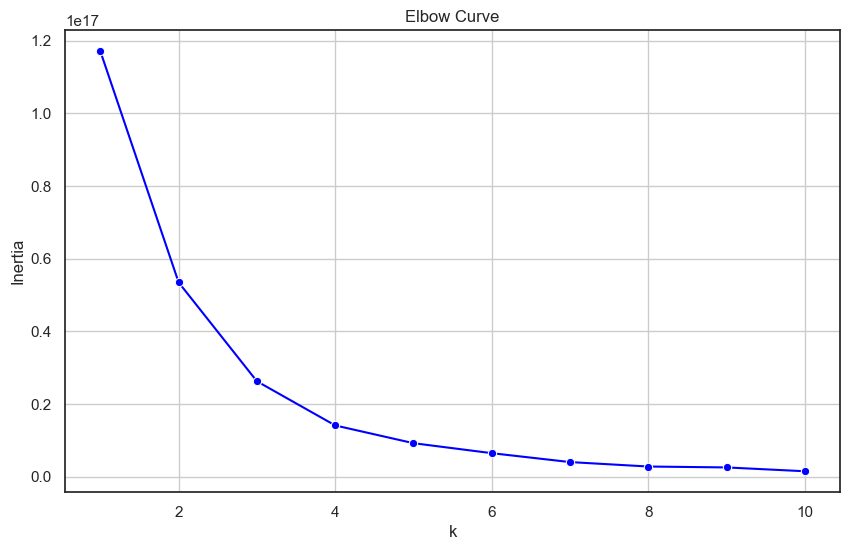

In [235]:
#Plot the elbow curve
plt.figure(figsize=(10, 6))
sns.lineplot(x="k", y="inertia", data=df_elbow, marker="o", color="blue")
plt.title("Elbow Curve")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.grid()
plt.show()

### The elbow curve shows that the optimal number of clusters is 3

In [236]:
#The elbow curve shows that the optimal number of clusters is 3

In [237]:
#Use the StandardScaler to scale the data
scaler = StandardScaler()
food_test_1_scaled = scaler.fit_transform(food_test_1)

In [238]:
food_test_1_scaled

array([[-1.46917268e-01, -1.39640373e-01, -1.51162442e-01, ...,
        -1.50461374e-01, -1.17394689e-01, -1.19257104e-01],
       [-4.95156585e-02,  2.68462328e-01,  3.21799206e-01, ...,
        -7.42372530e-02,  1.72934279e-01,  2.39435666e-04],
       [-2.16489846e-01, -2.26295163e-01, -2.44050792e-01, ...,
        -1.42097724e-01, -1.95037829e-01, -1.07595559e-01],
       ...,
       [-2.44318877e-01, -2.46554243e-01, -2.63269687e-01, ...,
        -1.55575633e-01, -3.12655655e-01, -3.09614681e-01],
       [-2.16489846e-01, -2.86775181e-01, -3.00564346e-01, ...,
        -1.56903645e-01, -3.58011549e-01, -3.18292242e-01],
       [-2.30404361e-01, -2.91009805e-01, -3.04770712e-01, ...,
        -1.71342244e-01, -3.74155172e-01, -3.37328000e-01]])

In [239]:
#Get the column names for the dataset
food_test_1.columns

Index(['Urban', 'Pop2010', 'OHU2010', 'LILATracts_1And10',
       'LILATracts_halfAnd10', 'LILATracts_1And20', 'LILATracts_Vehicle',
       'HUNVFlag', 'LowIncomeTracts', 'PovertyRate', 'MedianFamilyIncome',
       'LA1and10', 'LAhalfand10', 'LA1and20', 'LATracts_half', 'LATracts1',
       'LATracts10', 'LATracts20', 'LATractsVehicle_20', 'LAPOP1_10',
       'LAPOP05_10', 'LAPOP1_20', 'LALOWI1_10', 'LALOWI05_10', 'LALOWI1_20',
       'lapophalf', 'lapophalfshare', 'lalowihalf', 'lalowihalfshare',
       'laseniorshalf', 'laseniorshalfshare', 'lawhitehalf',
       'lawhitehalfshare', 'lablackhalf', 'lablackhalfshare', 'laasianhalf',
       'laasianhalfshare', 'lanhopihalf', 'lanhopihalfshare', 'laaianhalf',
       'laaianhalfshare', 'laomultirhalf', 'laomultirhalfshare', 'lahisphalf',
       'lahisphalfshare', 'lahunvhalf', 'lahunvhalfshare'],
      dtype='object')

In [240]:
#Add the column names to the scaled dataset
food_test_1_scaled = pd.DataFrame(food_test_1_scaled, columns=food_test_1.columns)


In [241]:
#View the correlation matrix
correlation = food_test_1_scaled.corr()
correlation

,Urban,Pop2010,OHU2010,LILATracts_1And10,LILATracts_halfAnd10,LILATracts_1And20,LILATracts_Vehicle,HUNVFlag,LowIncomeTracts,PovertyRate,...,lanhopihalf,lanhopihalfshare,laaianhalf,laaianhalfshare,laomultirhalf,laomultirhalfshare,lahisphalf,lahisphalfshare,lahunvhalf,lahunvhalfshare
Urban,1.000000,0.986555,0.986154,0.645336,0.893407,0.654925,0.759898,0.813474,0.959414,0.966240,...,0.295499,0.296453,0.356972,0.341457,0.834235,0.856058,0.780694,0.811546,0.876891,0.861214
Pop2010,0.986555,1.000000,0.995865,0.673686,0.893987,0.681930,0.736865,0.799157,0.935919,0.943271,...,0.313433,0.309387,0.381504,0.356702,0.877461,0.886256,0.831518,0.850890,0.867750,0.829305
OHU2010,0.986154,0.995865,1.000000,0.685985,0.897256,0.695122,0.764967,0.828823,0.932373,0.943648,...,0.302169,0.298756,0.377473,0.355560,0.846222,0.857228,0.798617,0.819301,0.890818,0.852724
LILATracts_1And10,0.645336,0.673686,0.685985,1.000000,0.855452,0.993913,0.818354,0.788915,0.676199,0.689374,...,0.227457,0.221549,0.408741,0.394004,0.663497,0.653769,0.668810,0.657466,0.783156,0.748602
LILATracts_halfAnd10,0.893407,0.893987,0.897256,0.855452,1.000000,0.859199,0.898980,0.890721,0.911855,0.920661,...,0.259193,0.258130,0.406474,0.392174,0.837462,0.849574,0.809534,0.826267,0.924527,0.913018
LILATracts_1And20,0.654925,0.681930,0.695122,0.993913,0.859199,1.000000,0.824139,0.798064,0.680288,0.695497,...,0.224137,0.219479,0.393784,0.376987,0.664392,0.655737,0.669830,0.659391,0.792685,0.757586
LILATracts_Vehicle,0.759898,0.736865,0.764967,0.818354,0.898980,0.824139,1.000000,0.968781,0.800646,0.822801,...,0.165271,0.169061,0.332464,0.330318,0.580084,0.598547,0.567373,0.583052,0.946871,0.953735
HUNVFlag,0.813474,0.799157,0.828823,0.788915,0.890721,0.798064,0.968781,1.000000,0.810188,0.837090,...,0.192656,0.194770,0.318596,0.312630,0.604621,0.621548,0.580971,0.597086,0.983787,0.971532
LowIncomeTracts,0.959414,0.935919,0.932373,0.676199,0.911855,0.680288,0.800646,0.810188,1.000000,0.990980,...,0.251278,0.253106,0.347427,0.333083,0.806496,0.828800,0.770611,0.799078,0.857392,0.862565
PovertyRate,0.966240,0.943271,0.943648,0.689374,0.920661,0.695497,0.822801,0.837090,0.990980,1.000000,...,0.247832,0.250259,0.362041,0.350321,0.802154,0.825989,0.769067,0.798250,0.882158,0.888578


In [242]:
#Calculate the covariance matrix of the scaled data
covariance_matrix = np.cov(food_test_1_scaled.T)

In [243]:
#Calculate the eigenvalues and eigenvectors of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)


In [244]:
len(eigenvalues)


47

In [245]:
#Print the first eigenvalue
print(eigenvalues[0])

34.47778136890521


In [246]:
#Print the first eigenvector
print(eigenvectors[:, 0])

[0.15775361 0.1608629  0.16171815 0.14359112 0.16340585 0.14481494
 0.1453812  0.15211339 0.15054269 0.1540386  0.15421659 0.16052128
 0.16726599 0.1603898  0.16719336 0.16028467 0.00230475 0.01463741
 0.15238225 0.15622749 0.16773383 0.15606893 0.15098369 0.16723637
 0.1512605  0.16752806 0.168192   0.16633583 0.16617735 0.16279044
 0.16090495 0.16066606 0.16086996 0.13436576 0.12843879 0.13004531
 0.12975722 0.05574094 0.05514394 0.07536303 0.07200688 0.14685008
 0.14792375 0.14006553 0.14234757 0.1596455  0.15297288]


In [247]:
#Calculate the explained variance
explained_variance = (eigenvalues / sum(eigenvalues)) * 100
explained_variance


array([ 7.33336344e+01,  6.35996644e+00,  5.29592341e+00,  3.80140626e+00,
        3.12310484e+00,  2.26837100e+00,  1.51958937e+00,  1.10538786e+00,
        9.34186835e-01,  5.54994332e-01,  4.30970745e-01,  3.06666995e-01,
        2.00608351e-01,  1.47985520e-01,  1.26367941e-01,  1.21133594e-01,
        6.42398800e-02,  6.03748259e-02,  4.63290445e-02,  3.59152686e-02,
        3.29555177e-02,  2.35730194e-02,  2.13552042e-02,  1.38932098e-02,
        1.29332467e-02,  1.13291856e-02,  1.04758224e-02,  7.05269641e-03,
        5.61189480e-03,  5.08162393e-03,  4.05805416e-03,  3.49532258e-03,
        2.68387061e-03,  2.06458101e-03,  1.72071217e-03,  1.15636664e-03,
        1.06876582e-03,  9.26073544e-04,  8.17806051e-04,  3.63740475e-04,
        1.60026692e-04,  6.63361534e-05,  3.31931155e-10,  1.00044715e-10,
       -7.84948098e-17, -1.47147384e-15,  1.02010728e-15])

In [248]:
#Create a function to calculate the cumulative explained variance
def calculate_cum_var_exp(eig_vals):
    tot = sum(eig_vals)
    #var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
    #var_exp = [(i / tot)*100 for i in eig_vals]
    var_exp = []
    for i in eig_vals:
        var_i = (i / tot)*100
        var_exp.append(var_i)
    cum_var_exp = np.cumsum(var_exp)
    return cum_var_exp

In [249]:
#Create a function to plot the explained variance
def plot_var_exp(eig_vals):

    cum_var_exp = calculate_cum_var_exp(eig_vals)

    plt.figure(figsize=(9,7))

    component_number = [i+1 for i in range(len(cum_var_exp))]

    plt.plot(component_number, cum_var_exp, lw=7)

    plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
    plt.axhline(y=100, linewidth=3, color='grey', ls='dashed')

    ax = plt.gca()
    ax.set_xlim([1,30])
    ax.set_ylim([-5,105])

    ax.set_ylabel('cumulative variance explained', fontsize=16)
    ax.set_xlabel('component', fontsize=16)

    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12)

    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12)

    ax.set_title('component vs cumulative variance explained\n', fontsize=20)

    plt.show()

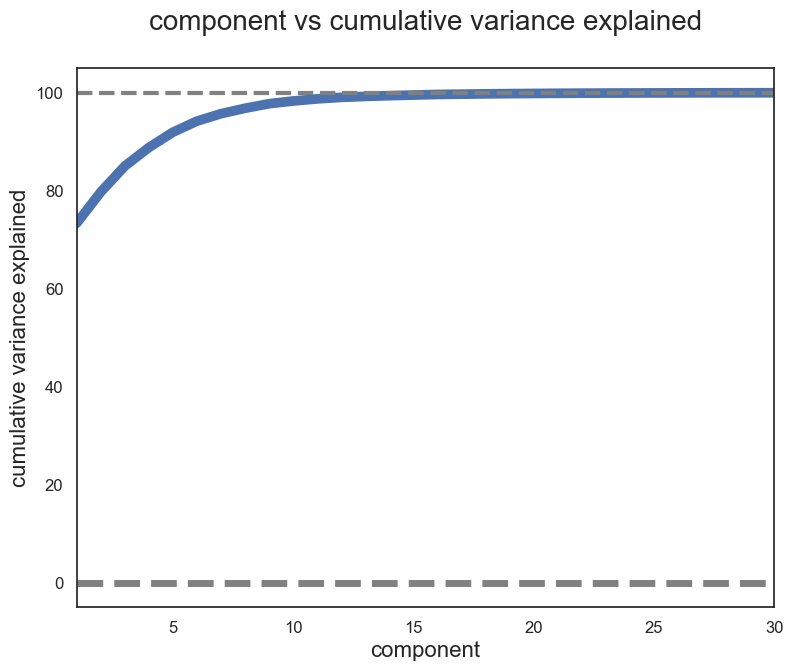

In [250]:
plot_var_exp(eigenvalues)

In [251]:
#Instantiate the PCA model
pca = PCA(n_components=3)
#Fit the model to the scaled data
pca.fit(food_test_1_scaled)

PCA(n_components=3)

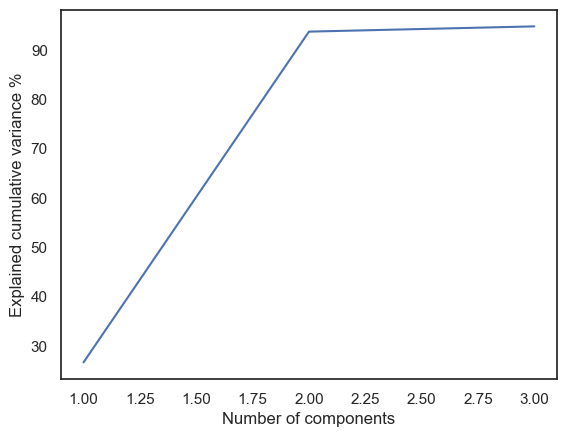

In [252]:
#Plot the cumulative explained variance vs the number of components
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), 100 - (100*pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Explained cumulative variance %')
plt.show()

In [253]:
#Transform standardized data with PCA
pca = PCA(n_components=2)
#Fit pca with starndardized features
pca.fit(food_test_1_scaled)
new_pca = pca.transform(food_test_1_scaled)


In [254]:
#Show in a DataFrame
new_pca = pd.DataFrame(new_pca, columns=['PCA1', 'PCA2'])
new_pca.head()

,PCA1,PCA2
0,-0.651595,-0.190018
1,1.388508,-0.414998
2,-1.220154,0.002150
3,-1.876581,-0.052994
4,-1.331066,-0.022022


In [255]:
#Convert PCA1 and PCA2 to the feature names in the dataset
new_pca['State'] = food_test_1.index.get_level_values(0)
new_pca['County'] = food_test_1.index.get_level_values(1)
new_pca.head()

,PCA1,PCA2,State,County
0,-0.651595,-0.190018,Alabama,Autauga County
1,1.388508,-0.414998,Alabama,Baldwin County
2,-1.220154,0.002150,Alabama,Barbour County
3,-1.876581,-0.052994,Alabama,Bibb County
4,-1.331066,-0.022022,Alabama,Blount County


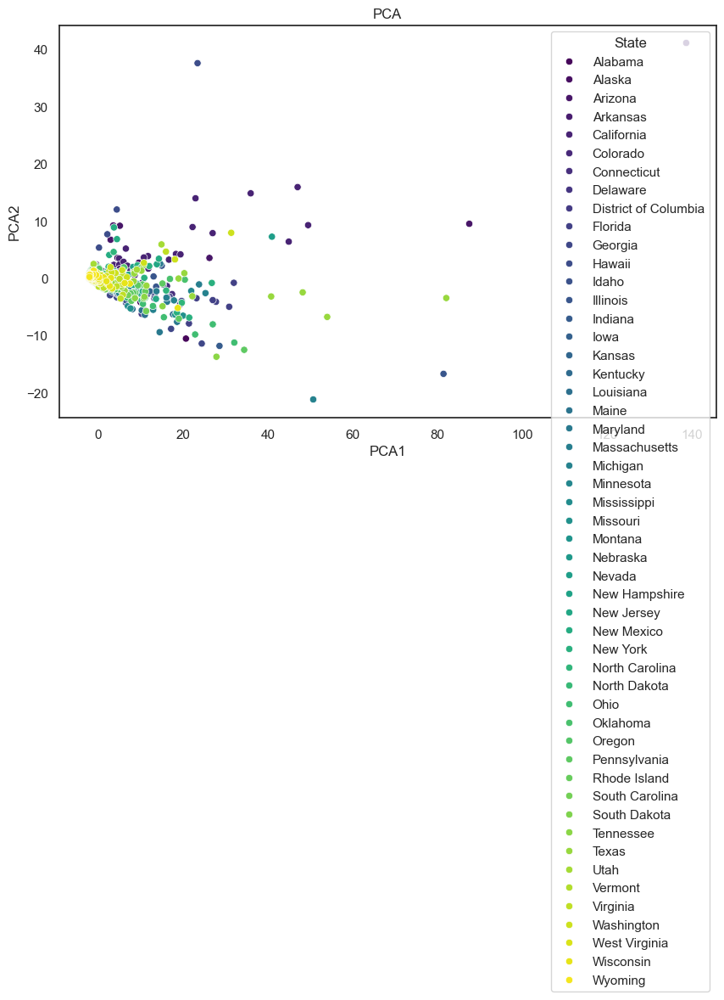

In [256]:
#Plot the PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', data=new_pca, hue='State', palette='viridis')
plt.title('PCA')
plt.show()


### This really didn't help me. This is giving me which states are similar, based on cluster.
- I feel that the features are too large and too different (population #s vs share of population vs flags for urban vs vehicle, etc)
- Need to go back to my initial question and simplify what I need, in order to answer my question.

### Re-state question:
#### What does my stakeholder want to know?
1. They want to know where to allocate funds, in order to best help seniors access a food source.
2. They want to prioritize where to spend funds, based on need.
3. Using criteria set at state and county level, they want to see if they can accurately predict whether there is a similar need at a city or neighborhood level.

In [257]:
#Using the food dataset, let's visualize where the food deserts for seniors are located.
#Create a new dataset 'food_clean_seniors' that contains the columns that pertain to seniors
food_seniors = food_clean.copy()
#First, group by 'State' and 'County' and sum the values
food_seniors = food_seniors.groupby(['State', 'County']).sum()

In [258]:
food_seniors.head()


Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  TractLOWI  TractSeniors  TractWhite  \
State   County                       ...                                        
Alabama Autauga County        193.5  ...    17243.0        6546.0     42855.0   
        Baldwin County        367.2  ...    57843.0       30568.0    156153.0   
        Barbour County        263.8  ...    12073.0        3909.0     13180.0   
        Bibb County            48.7  ...     7968.0        2906.0     17381.0   
        Blount County         133.7  ...    20795.0        8439.0     53068.0   

                        TractBlack  TractAsian  TractNHOPI  TractAIAN  \
State   County                                                          
Alabama Autauga County      9643.0       474.0        32.0      232.0   
        Baldwin County     17105.0      1348.0        89.0     1216.0   
        Barbour County     12875.0       107.0        29.0      114.0   
        Bibb County         5047.0        22.0        13.0       64.0   
        Blount County        761.0       117.0        38.0      307.0   

                        TractOMultir  TractHispanic  TractHUNV  
State   County                                                  
Alabama Autauga County        1335.0         1310.0     1191.0  
        Baldwin County        6354.0         7992.0     2705.0  
        Barbour County        1152.0         1387.0      849.0  
        Bibb County            388.0          406.0      410.0  
        Blount County         3031.0         4626.0      856.0  

[5 rows x 123 columns]

In [259]:
#Drop column 0 through 11
food_seniors = food_seniors.drop(food_seniors.columns[0:11], axis=1)
food_seniors.head()

LA1and10  LAhalfand10  LA1and20  LATracts_half  \
State   County                                                           
Alabama Autauga County         9            9         7              7   
        Baldwin County        14           15        13             14   
        Barbour County         4            5         1              2   
        Bibb County            0            0         0              0   
        Blount County          1            1         1              1   

                        LATracts1  LATracts10  LATracts20  LATractsVehicle_20  \
State   County                                                                  
Alabama Autauga County          7           2           0                   3   
        Baldwin County         13           1           0                   6   
        Barbour County          1           3           0                   3   
        Bibb County             0           0           0                   2   
        Blount County           1           0           0                   4   

                        LAPOP1_10  LAPOP05_10  ...  TractLOWI  TractSeniors  \
State   County                                 ...                            
Alabama Autauga County    18503.0     29442.0  ...    17243.0        6546.0   
        Baldwin County    45789.0     71643.0  ...    57843.0       30568.0   
        Barbour County     5636.0      8563.0  ...    12073.0        3909.0   
        Bibb County         365.0       365.0  ...     7968.0        2906.0   
        Blount County      3902.0      5432.0  ...    20795.0        8439.0   

                        TractWhite  TractBlack  TractAsian  TractNHOPI  \
State   County                                                           
Alabama Autauga County     42855.0      9643.0       474.0        32.0   
        Baldwin County    156153.0     17105.0      1348.0        89.0   
        Barbour County     13180.0     12875.0       107.0        29.0   
        Bibb County        17381.0      5047.0        22.0        13.0   
        Blount County      53068.0       761.0       117.0        38.0   

                        TractAIAN  TractOMultir  TractHispanic  TractHUNV  
State   County                                                             
Alabama Autauga County      232.0        1335.0         1310.0     1191.0  
        Baldwin County     1216.0        6354.0         7992.0     2705.0  
        Barbour County      114.0        1152.0         1387.0      849.0  
        Bibb County          64.0         388.0          406.0      410.0  
        Blount County       307.0        3031.0         4626.0      856.0  

[5 rows x 112 columns]

In [260]:
#Drop columns 0 through 11
food_seniors = food_seniors.drop(food_seniors.columns[0:11], axis=1)

In [261]:
food_seniors.head()


LALOWI1_10  LALOWI05_10  LALOWI1_20  lapophalf  \
State   County                                                           
Alabama Autauga County      7106.0      10300.0      4799.0    49497.0   
        Baldwin County     14468.0      22146.0     13622.0   165616.0   
        Barbour County      2864.0       4452.0       424.0    23762.0   
        Bibb County          102.0        102.0         0.0    20989.0   
        Blount County       1440.0       2039.0      1440.0    54933.0   

                        lapophalfshare  lalowihalf  lalowihalfshare  \
State   County                                                        
Alabama Autauga County         1116.10     15518.0           383.91   
        Baldwin County         2828.41     48117.0           848.82   
        Barbour County          771.15     11901.0           385.22   
        Bibb County             376.22      8349.0           141.76   
        Blount County           861.93     19806.0           313.84   

                        laseniorshalf  laseniorshalfshare  lawhitehalf  ...  \
State   County                                                          ...   
Alabama Autauga County         5935.0              136.91      38699.0  ...   
        Baldwin County        27241.0              489.70     142534.0  ...   
        Barbour County         3348.0              116.79      11829.0  ...   
        Bibb County            2630.0               48.02      16162.0  ...   
        Blount County          7810.0              123.27      50968.0  ...   

                        TractLOWI  TractSeniors  TractWhite  TractBlack  \
State   County                                                            
Alabama Autauga County    17243.0        6546.0     42855.0      9643.0   
        Baldwin County    57843.0       30568.0    156153.0     17105.0   
        Barbour County    12073.0        3909.0     13180.0     12875.0   
        Bibb County        7968.0        2906.0     17381.0      5047.0   
        Blount County     20795.0        8439.0     53068.0       761.0   

                        TractAsian  TractNHOPI  TractAIAN  TractOMultir  \
State   County                                                            
Alabama Autauga County       474.0        32.0      232.0        1335.0   
        Baldwin County      1348.0        89.0     1216.0        6354.0   
        Barbour County       107.0        29.0      114.0        1152.0   
        Bibb County           22.0        13.0       64.0         388.0   
        Blount County        117.0        38.0      307.0        3031.0   

                        TractHispanic  TractHUNV  
State   County                                    
Alabama Autauga County         1310.0     1191.0  
        Baldwin County         7992.0     2705.0  
        Barbour County         1387.0      849.0  
        Bibb County             406.0      410.0  
        Blount County          4626.0      856.0  

[5 rows x 101 columns]

In [262]:
#Drop columns 0 though 6
food_seniors = food_seniors.drop(food_seniors.columns[0:6], axis=1)
food_seniors.head()


lalowihalfshare  laseniorshalf  laseniorshalfshare  \
State   County                                                               
Alabama Autauga County           383.91         5935.0              136.91   
        Baldwin County           848.82        27241.0              489.70   
        Barbour County           385.22         3348.0              116.79   
        Bibb County              141.76         2630.0               48.02   
        Blount County            313.84         7810.0              123.27   

                        lawhitehalf  lawhitehalfshare  lablackhalf  \
State   County                                                       
Alabama Autauga County      38699.0            838.70       8987.0   
        Baldwin County     142534.0           2440.10      14958.0   
        Barbour County      11829.0            386.57      10675.0   
        Bibb County         16162.0            303.83       4361.0   
        Blount County       50968.0            799.95        716.0   

                        lablackhalfshare  laasianhalf  laasianhalfshare  \
State   County                                                            
Alabama Autauga County            238.45        374.0              5.74   
        Baldwin County            257.11       1155.0             16.96   
        Barbour County            348.69         74.0              2.36   
        Bibb County                64.18         22.0              0.34   
        Blount County               9.61        106.0              1.53   

                        lanhopihalf  ...  TractLOWI  TractSeniors  TractWhite  \
State   County                       ...                                        
Alabama Autauga County         23.0  ...    17243.0        6546.0     42855.0   
        Baldwin County         83.0  ...    57843.0       30568.0    156153.0   
        Barbour County         29.0  ...    12073.0        3909.0     13180.0   
        Bibb County            13.0  ...     7968.0        2906.0     17381.0   
        Blount County          38.0  ...    20795.0        8439.0     53068.0   

                        TractBlack  TractAsian  TractNHOPI  TractAIAN  \
State   County                                                          
Alabama Autauga County      9643.0       474.0        32.0      232.0   
        Baldwin County     17105.0      1348.0        89.0     1216.0   
        Barbour County     12875.0       107.0        29.0      114.0   
        Bibb County         5047.0        22.0        13.0       64.0   
        Blount County        761.0       117.0        38.0      307.0   

                        TractOMultir  TractHispanic  TractHUNV  
State   County                                                  
Alabama Autauga County        1335.0         1310.0     1191.0  
        Baldwin County        6354.0         7992.0     2705.0  
        Barbour County        1152.0         1387.0      849.0  
        Bibb County            388.0          406.0      410.0  
        Blount County         3031.0         4626.0      856.0  

[5 rows x 95 columns]

In [263]:
#Drop column 0
food_seniors = food_seniors.drop(food_seniors.columns[0], axis=1)
food_seniors.head()

laseniorshalf  laseniorshalfshare  lawhitehalf  \
State   County                                                           
Alabama Autauga County         5935.0              136.91      38699.0   
        Baldwin County        27241.0              489.70     142534.0   
        Barbour County         3348.0              116.79      11829.0   
        Bibb County            2630.0               48.02      16162.0   
        Blount County          7810.0              123.27      50968.0   

                        lawhitehalfshare  lablackhalf  lablackhalfshare  \
State   County                                                            
Alabama Autauga County            838.70       8987.0            238.45   
        Baldwin County           2440.10      14958.0            257.11   
        Barbour County            386.57      10675.0            348.69   
        Bibb County               303.83       4361.0             64.18   
        Blount County             799.95        716.0              9.61   

                        laasianhalf  laasianhalfshare  lanhopihalf  \
State   County                                                       
Alabama Autauga County        374.0              5.74         23.0   
        Baldwin County       1155.0             16.96         83.0   
        Barbour County         74.0              2.36         29.0   
        Bibb County            22.0              0.34         13.0   
        Blount County         106.0              1.53         38.0   

                        lanhopihalfshare  ...  TractLOWI  TractSeniors  \
State   County                            ...                            
Alabama Autauga County              0.39  ...    17243.0        6546.0   
        Baldwin County              1.27  ...    57843.0       30568.0   
        Barbour County              0.65  ...    12073.0        3909.0   
        Bibb County                 0.15  ...     7968.0        2906.0   
        Blount County               0.56  ...    20795.0        8439.0   

                        TractWhite  TractBlack  TractAsian  TractNHOPI  \
State   County                                                           
Alabama Autauga County     42855.0      9643.0       474.0        32.0   
        Baldwin County    156153.0     17105.0      1348.0        89.0   
        Barbour County     13180.0     12875.0       107.0        29.0   
        Bibb County        17381.0      5047.0        22.0        13.0   
        Blount County      53068.0       761.0       117.0        38.0   

                        TractAIAN  TractOMultir  TractHispanic  TractHUNV  
State   County                                                             
Alabama Autauga County      232.0        1335.0         1310.0     1191.0  
        Baldwin County     1216.0        6354.0         7992.0     2705.0  
        Barbour County      114.0        1152.0         1387.0      849.0  
        Bibb County          64.0         388.0          406.0      410.0  
        Blount County       307.0        3031.0         4626.0      856.0  

[5 rows x 94 columns]

In [264]:
#Drop columns 1 through 9
food_seniors = food_seniors.drop(food_seniors.columns[1:10], axis=1)
food_seniors.head()

laseniorshalf  laaianhalf  laaianhalfshare  \
State   County                                                       
Alabama Autauga County         5935.0       216.0             5.00   
        Baldwin County        27241.0      1135.0            21.90   
        Barbour County         3348.0       109.0             3.42   
        Bibb County            2630.0        60.0             1.16   
        Blount County          7810.0       296.0             4.48   

                        laomultirhalf  laomultirhalfshare  lahisphalf  \
State   County                                                          
Alabama Autauga County         1200.0               27.79      1166.0   
        Baldwin County         5757.0               91.10      7321.0   
        Barbour County         1047.0               29.44      1272.0   
        Bibb County             371.0                6.57       379.0   
        Blount County          2809.0               45.78      4262.0   

                        lahisphalfshare  lahunvhalf  lahunvhalfshare  \
State   County                                                         
Alabama Autauga County            26.96      1045.0            66.57   
        Baldwin County           107.89      2178.0           101.41   
        Barbour County            35.84       742.0            69.97   
        Bibb County                7.21       441.0            25.93   
        Blount County             68.95       822.0            34.71   

                          lapop1  ...  TractLOWI  TractSeniors  TractWhite  \
State   County                    ...                                        
Alabama Autauga County   37424.0  ...    17243.0        6546.0     42855.0   
        Baldwin County  132442.0  ...    57843.0       30568.0    156153.0   
        Barbour County   19007.0  ...    12073.0        3909.0     13180.0   
        Bibb County      17560.0  ...     7968.0        2906.0     17381.0   
        Blount County    50848.0  ...    20795.0        8439.0     53068.0   

                        TractBlack  TractAsian  TractNHOPI  TractAIAN  \
State   County                                                          
Alabama Autauga County      9643.0       474.0        32.0      232.0   
        Baldwin County     17105.0      1348.0        89.0     1216.0   
        Barbour County     12875.0       107.0        29.0      114.0   
        Bibb County         5047.0        22.0        13.0       64.0   
        Blount County        761.0       117.0        38.0      307.0   

                        TractOMultir  TractHispanic  TractHUNV  
State   County                                                  
Alabama Autauga County        1335.0         1310.0     1191.0  
        Baldwin County        6354.0         7992.0     2705.0  
        Barbour County        1152.0         1387.0      849.0  
        Bibb County            388.0          406.0      410.0  
        Blount County         3031.0         4626.0      856.0  

[5 rows x 85 columns]

In [265]:
#Create a new dataset 'seniors_location' that contains the columns 'State', 'County', 'laseniorshalf', 'laseniors1', 'laseniors10', 'laseniors20'
seniors_location = food_seniors[['laseniorshalf', 'laseniors1', 'laseniors10', 'laseniors20']]
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20
State   County                                                             
Alabama Autauga County         5935.0      4393.0        707.0          0.0
        Baldwin County        27241.0     21828.0        390.0          0.0
        Barbour County         3348.0      2537.0        629.0          0.0
        Bibb County            2630.0      2262.0         72.0          0.0
        Blount County          7810.0      7114.0          0.0          0.0

In [266]:
#Add two new columns to the 'seniors_location' dataset - 'State' and 'County'
seniors_location['State'] = food_seniors.index.get_level_values(0)
seniors_location['County'] = food_seniors.index.get_level_values(1)
seniors_location.head()

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/4003880631.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seniors_location['State'] = food_seniors.index.get_level_values(0)
/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/4003880631.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seniors_location['County'] = food_seniors.index.get_level_values(1)


laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                          State          County  
State   County                                   
Alabama Autauga County  Alabama  Autauga County  
        Baldwin County  Alabama  Baldwin County  
        Barbour County  Alabama  Barbour County  
        Bibb County     Alabama     Bibb County  
        Blount County   Alabama   Blount County

In [267]:
#Rename the new columns  to 'County1' and 'State1'
seniors_location = seniors_location.rename(columns={'State': 'State1', 'County': 'County1'})
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                         State1         County1  
State   County                                   
Alabama Autauga County  Alabama  Autauga County  
        Baldwin County  Alabama  Baldwin County  
        Barbour County  Alabama  Barbour County  
        Bibb County     Alabama     Bibb County  
        Blount County   Alabama   Blount County

In [268]:
#Concatenate the 'County1' and the 'State1' columns, with a ', ' to a new column 'Location'
seniors_location['Location'] = seniors_location['County1'] + ', ' + seniors_location['State1']
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                         State1         County1                 Location  
State   County                                                            
Alabama Autauga County  Alabama  Autauga County  Autauga County, Alabama  
        Baldwin County  Alabama  Baldwin County  Baldwin County, Alabama  
        Barbour County  Alabama  Barbour County  Barbour County, Alabama  
        Bibb County     Alabama     Bibb County     Bibb County, Alabama  
        Blount County   Alabama   Blount County   Blount County, Alabama

In [269]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [270]:
#Using Folium, create a map that shows where the food deserts for seniors are located
import folium

In [271]:
from geopy.geocoders import GoogleV3
geo_locator = GoogleV3(api_key="REDACTED FOR SECURITY")

In [272]:
#Using the geolocator and the 'Location' column, get the latitude and longitude for each location and store it in a new column 'Coordinates'
seniors_location['Coordinates'] = seniors_location['Location'].apply(geo_locator.geocode).apply(lambda x: (x.latitude, x.longitude))


In [273]:
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                         State1         County1                 Location  \
State   County                                                             
Alabama Autauga County  Alabama  Autauga County  Autauga County, Alabama   
        Baldwin County  Alabama  Baldwin County  Baldwin County, Alabama   
        Barbour County  Alabama  Barbour County  Barbour County, Alabama   
        Bibb County     Alabama     Bibb County     Bibb County, Alabama   
        Blount County   Alabama   Blount County   Blount County, Alabama   

                                             Coordinates  
State   County                                            
Alabama Autauga County  (32.5791817, -86.49965460000001)  
        Baldwin County  (30.6010744, -87.77633329999999)  
        Barbour County  (31.8172896, -85.35496499999999)  
        Bibb County     (32.9562798, -87.14228949999999)  
        Blount County   (34.0145152, -86.49965460000001)

In [274]:
#Create a map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
map

In [275]:
#Plot the locations of the food deserts for seniors
for i in range(len(seniors_location)):
    folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/87939291.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


In [276]:
#Show the map
map

In [277]:
#Only show the locations of 'laseniors20' on the map
#Create a map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
#Plot only the locations of 'laseniors20'
for i in range(len(seniors_location)):
    folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)
#Show the map
map

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/2571017820.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


In [278]:
#Create a map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

In [279]:
map

In [280]:
#Plot only the coordinates of 'laseniors20' on the map, where value is greater than 0
for i in range(len(seniors_location)):
    if seniors_location['laseniors20'][i] > 0:
        folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)
#Show the map
map

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/926489332.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if seniors_location['laseniors20'][i] > 0:
/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/926489332.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


In [281]:
#Creat a new map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
map

In [282]:
#Plot only the coordinates of 'laseniors10' on the map, where the value is greater than 0
for i in range(len(seniors_location)):
    if seniors_location['laseniors10'][i] > 0:
        folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)
#Show the map
map

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/4007200045.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if seniors_location['laseniors10'][i] > 0:
/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/4007200045.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


In [283]:
#Create a new map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
map

In [284]:
#Plot only the coordinates of 'laseniors1' on the map, where the value is greater than 0
for i in range(len(seniors_location)):
    if seniors_location['laseniors1'][i] > 0:
        folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)
#Show the map
map

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/3325802760.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if seniors_location['laseniors1'][i] > 0:
/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/3325802760.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


In [285]:
#Create a new map centered at the United States
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
map

In [286]:
#Plot only the coordinates of 'laseniorshalf' on the map, where the value is greater than 0
for i in range(len(seniors_location)):
    if seniors_location['laseniorshalf'][i] > 0:
        folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)
#Show the map
map

/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/2627944449.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if seniors_location['laseniorshalf'][i] > 0:
/var/folders/gr/0cyzht9j16g818rxhk08kvnr0000gn/T/ipykernel_97121/2627944449.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  folium.Marker(location=seniors_location['Coordinates'][i], popup=seniors_location['Coordinates'][i]).add_to(map)


### Interesting! Particularly with the "Greater than 20 miles away" Group
- The western half of the US seems to have a disproportionate amount of food deserts for seniors.
- Need to take a closer look and narrow it down.
- Instead of taking a "greater than zero" let's get the mean and plot each feature that are greater than the mean for each one.

In [287]:
#Describe the dataset
seniors_location.describe()

,laseniorshalf,laseniors1,laseniors10,laseniors20
count,3142.000000,3142.000000,3142.000000,3142.000000
mean,9148.152132,5339.462444,274.733609,30.331636
std,20213.494429,8298.883326,382.571407,137.677105
min,12.000000,0.000000,0.000000,0.000000
25%,1556.250000,1194.250000,28.000000,0.000000
50%,3423.500000,2693.500000,165.500000,0.000000
75%,8226.750000,5919.750000,388.750000,0.000000
max,431862.000000,123489.000000,5801.000000,4165.000000


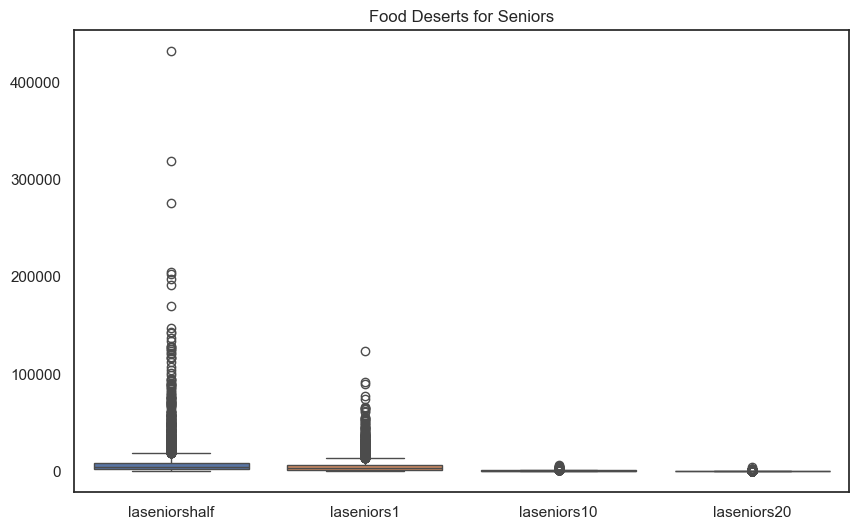

In [288]:
#Visualize the data using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=seniors_location)
plt.title('Food Deserts for Seniors')
plt.show()



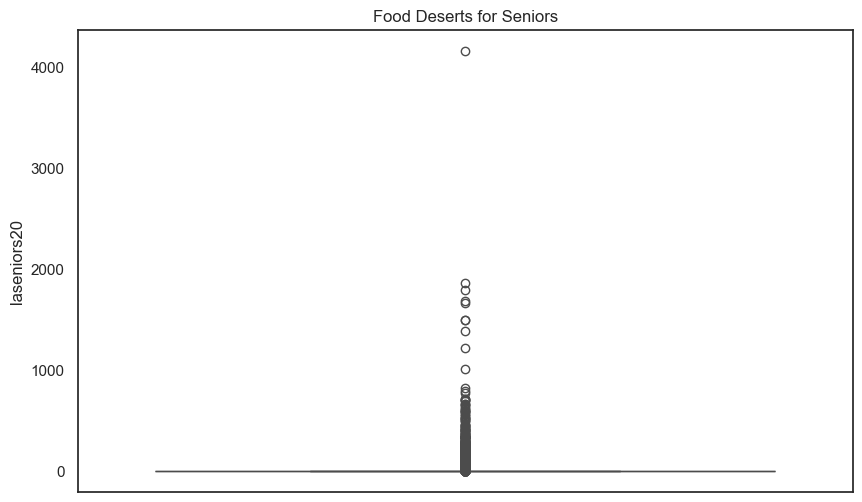

In [289]:
#Visualize the 'laseniors20' column using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=seniors_location['laseniors20'])
plt.title('Food Deserts for Seniors')
plt.show()

In [290]:
#Calculate the median of the 'laseniors20' column
median = seniors_location['laseniors20'].median()
median

0.0

In [291]:
#calculate the median of the 'laseniors10' column
median = seniors_location['laseniors10'].median()
median

165.5

In [292]:
#Calculate the median of the 'laseniors1' column
median = seniors_location['laseniors1'].median()
median

2693.5

In [293]:
#Calculate the median of the 'laseniorshalf' column
median = seniors_location['laseniorshalf'].median()
median

3423.5

In [294]:
#Add the 'TractSeniors' column to the 'seniors_location' dataset
seniors_location['TractSeniors'] = food_seniors['TractSeniors']
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                         State1         County1                 Location  \
State   County                                                             
Alabama Autauga County  Alabama  Autauga County  Autauga County, Alabama   
        Baldwin County  Alabama  Baldwin County  Baldwin County, Alabama   
        Barbour County  Alabama  Barbour County  Barbour County, Alabama   
        Bibb County     Alabama     Bibb County     Bibb County, Alabama   
        Blount County   Alabama   Blount County   Blount County, Alabama   

                                             Coordinates  TractSeniors  
State   County                                                          
Alabama Autauga County  (32.5791817, -86.49965460000001)        6546.0  
        Baldwin County  (30.6010744, -87.77633329999999)       30568.0  
        Barbour County  (31.8172896, -85.35496499999999)        3909.0  
        Bibb County     (32.9562798, -87.14228949999999)        2906.0  
        Blount County   (34.0145152, -86.49965460000001)        8439.0

In [295]:
#To help quantify a need, let's calculate the percentage of seniors that fall into any of the four categories.
#First, add the total senior population in each class.
seniors_total = seniors_location['laseniors20'] + seniors_location['laseniors10'] + seniors_location['laseniors1'] + seniors_location['laseniorshalf']
#Then add the total senior population in each county (tract totals, already summed by county)
total = seniors_location['TractSeniors']
#Calculate the percentage of seniors that fall into any of the four categories
percentage = (seniors_total/total) * 100
percentage

State    County           
Alabama  Autauga County       168.576230
         Baldwin County       161.799921
         Barbour County       166.641085
         Bibb County          170.818995
         Blount County        176.845598
                                 ...    
Wyoming  Sweetwater County    166.017019
         Teton County         199.189704
         Uinta County         147.598719
         Washakie County      119.562334
         Weston County        134.029591
Length: 3142, dtype: float64

In [296]:
#Add the la pop columns to the 'seniors_location' dataset. 'lapop20', 'lapop10', 'lapop1', 'lapophalf'
seniors_location['lapop20'] = food_seniors['lapop20']
seniors_location['lapop10'] = food_seniors['lapop10']
seniors_location['lapop1'] = food_seniors['lapop1']
seniors_location.head()

laseniorshalf  laseniors1  laseniors10  laseniors20  \
State   County                                                                
Alabama Autauga County         5935.0      4393.0        707.0          0.0   
        Baldwin County        27241.0     21828.0        390.0          0.0   
        Barbour County         3348.0      2537.0        629.0          0.0   
        Bibb County            2630.0      2262.0         72.0          0.0   
        Blount County          7810.0      7114.0          0.0          0.0   

                         State1         County1                 Location  \
State   County                                                             
Alabama Autauga County  Alabama  Autauga County  Autauga County, Alabama   
        Baldwin County  Alabama  Baldwin County  Baldwin County, Alabama   
        Barbour County  Alabama  Barbour County  Barbour County, Alabama   
        Bibb County     Alabama     Bibb County     Bibb County, Alabama   
        Blount County   Alabama   Blount County   Blount County, Alabama   

                                             Coordinates  TractSeniors  \
State   County                                                           
Alabama Autauga County  (32.5791817, -86.49965460000001)        6546.0   
        Baldwin County  (30.6010744, -87.77633329999999)       30568.0   
        Barbour County  (31.8172896, -85.35496499999999)        3909.0   
        Bibb County     (32.9562798, -87.14228949999999)        2906.0   
        Blount County   (34.0145152, -86.49965460000001)        8439.0   

                        lapop20  lapop10    lapop1  
State   County                                      
Alabama Autauga County      0.0   5119.0   37424.0  
        Baldwin County      0.0   2308.0  132442.0  
        Barbour County      0.0   4643.0   19007.0  
        Bibb County         0.0    365.0   17560.0  
        Blount County       0.0      0.0   50848.0

In [297]:
#Divide 'lapop10' by laseniors10' to get the percentage of seniors that fall into the 'laseniors10' category
percentage_10 = (seniors_location['laseniors10']/seniors_location['lapop10']) * 100
percentage_10


State    County           
Alabama  Autauga County       13.811291
         Baldwin County       16.897747
         Barbour County       13.547275
         Bibb County          19.726027
         Blount County              NaN
                                ...    
Wyoming  Sweetwater County    10.007849
         Teton County         12.999404
         Uinta County         13.360882
         Washakie County      24.168514
         Weston County        18.333333
Length: 3142, dtype: float64

In [298]:
#View  the food_test_1 dataset
food_test_1.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lanhopihalf  lanhopihalfshare  \
State   County                       ...                                  
Alabama Autauga County        193.5  ...         23.0              0.39   
        Baldwin County        367.2  ...         83.0              1.27   
        Barbour County        263.8  ...         29.0              0.65   
        Bibb County            48.7  ...         13.0              0.15   
        Blount County         133.7  ...         38.0              0.56   

                        laaianhalf  laaianhalfshare  laomultirhalf  \
State   County                                                       
Alabama Autauga County       216.0             5.00         1200.0   
        Baldwin County      1135.0            21.90         5757.0   
        Barbour County       109.0             3.42         1047.0   
        Bibb County           60.0             1.16          371.0   
        Blount County        296.0             4.48         2809.0   

                        laomultirhalfshare  lahisphalf  lahisphalfshare  \
State   County                                                            
Alabama Autauga County               27.79      1166.0            26.96   
        Baldwin County               91.10      7321.0           107.89   
        Barbour County               29.44      1272.0            35.84   
        Bibb County                   6.57       379.0             7.21   
        Blount County                45.78      4262.0            68.95   

                        lahunvhalf  lahunvhalfshare  
State   County                                       
Alabama Autauga County      1045.0            66.57  
        Baldwin County      2178.0           101.41  
        Barbour County       742.0            69.97  
        Bibb County          441.0            25.93  
        Blount County        822.0            34.71  

[5 rows x 47 columns]

In [299]:
#Create a copy of the food_test_1 dataset
food_test_1_copy = food_test_1.copy()


In [300]:
#Remove all columnes with share in the name
food_test_1_copy = food_test_1_copy.drop(food_test_1_copy.columns[food_test_1_copy.columns.str.contains('share', case=False)], axis=1)
food_test_1_copy.head()

Urban  Pop2010  OHU2010  LILATracts_1And10  \
State   County                                                       
Alabama Autauga County      7    54571    20221                  5   
        Baldwin County     14   182265    73180                  4   
        Barbour County      2    27457     9820                  4   
        Bibb County         0    22915     7953                  0   
        Blount County       1    57322    21578                  0   

                        LILATracts_halfAnd10  LILATracts_1And20  \
State   County                                                    
Alabama Autauga County                     5                  3   
        Baldwin County                     4                  3   
        Barbour County                     5                  1   
        Bibb County                        0                  0   
        Blount County                      0                  0   

                        LILATracts_Vehicle  HUNVFlag  LowIncomeTracts  \
State   County                                                          
Alabama Autauga County                   1         3                5   
        Baldwin County                   3         6                7   
        Barbour County                   3         3                8   
        Bibb County                      1         2                1   
        Blount County                    2         4                3   

                        PovertyRate  ...  lalowihalf  laseniorshalf  \
State   County                       ...                              
Alabama Autauga County        193.5  ...     15518.0         5935.0   
        Baldwin County        367.2  ...     48117.0        27241.0   
        Barbour County        263.8  ...     11901.0         3348.0   
        Bibb County            48.7  ...      8349.0         2630.0   
        Blount County         133.7  ...     19806.0         7810.0   

                        lawhitehalf  lablackhalf  laasianhalf  lanhopihalf  \
State   County                                                               
Alabama Autauga County      38699.0       8987.0        374.0         23.0   
        Baldwin County     142534.0      14958.0       1155.0         83.0   
        Barbour County      11829.0      10675.0         74.0         29.0   
        Bibb County         16162.0       4361.0         22.0         13.0   
        Blount County       50968.0        716.0        106.0         38.0   

                        laaianhalf  laomultirhalf  lahisphalf  lahunvhalf  
State   County                                                             
Alabama Autauga County       216.0         1200.0      1166.0      1045.0  
        Baldwin County      1135.0         5757.0      7321.0      2178.0  
        Barbour County       109.0         1047.0      1272.0       742.0  
        Bibb County           60.0          371.0       379.0       441.0  
        Blount County        296.0         2809.0      4262.0       822.0  

[5 rows x 36 columns]

### Too focused on business question & not the data science translation - NEED TO GET AND UNDERSTAND MY TARGET VARIABLE

In [301]:
#Create a new dataset from the food dataset that contains the following columns: 'POP2010', 'OHU2010', 'PovertyRate', 'MedianFamilyIncome', 'laseniorshalf', laseniors1', 'laseniors10', 'laseniors20', 'TractSeniors'
food_target_sel = food[['Pop2010', 'OHU2010', 'PovertyRate', 'MedianFamilyIncome', 'laseniorshalf', 'laseniors1', 'laseniors10', 'laseniors20', 'TractSeniors']]
food_target_sel.head()

,Pop2010,OHU2010,PovertyRate,MedianFamilyIncome,laseniorshalf,laseniors1,laseniors10,laseniors20,TractSeniors
0,1912,693,11.3,81250.0,221.0,219.0,NaN,NaN,221.0
1,2170,743,17.9,49000.0,214.0,127.0,NaN,NaN,214.0
2,3373,1256,15.0,62609.0,358.0,201.0,NaN,NaN,439.0
3,4386,1722,2.8,70607.0,767.0,237.0,NaN,NaN,904.0
4,10766,4082,15.2,96334.0,840.0,362.0,NaN,NaN,1126.0


In [302]:
#Replace missing values with zero - these are likely areas with no affected population
food_target_sel = food_target_sel.fillna(0)

In [303]:
#Get the correlation between the columns
correlation = food_target_sel.corr()
correlation

,Pop2010,OHU2010,PovertyRate,MedianFamilyIncome,laseniorshalf,laseniors1,laseniors10,laseniors20,TractSeniors
Pop2010,1.000000,0.897393,-0.142212,0.126679,0.420123,0.292857,-0.060814,-0.038221,0.520575
OHU2010,0.897393,1.000000,-0.190677,0.166297,0.510192,0.340173,-0.049674,-0.034692,0.657663
PovertyRate,-0.142212,-0.190677,1.000000,-0.635930,-0.261135,-0.205479,-0.000009,0.014557,-0.243273
MedianFamilyIncome,0.126679,0.166297,-0.635930,1.000000,0.112493,0.050436,-0.082443,-0.033683,0.135470
laseniorshalf,0.420123,0.510192,-0.261135,0.112493,1.000000,0.828382,0.127544,0.034385,0.825387
laseniors1,0.292857,0.340173,-0.205479,0.050436,0.828382,1.000000,0.244450,0.071434,0.570219
laseniors10,-0.060814,-0.049674,-0.000009,-0.082443,0.127544,0.244450,1.000000,0.488691,0.040986
laseniors20,-0.038221,-0.034692,0.014557,-0.033683,0.034385,0.071434,0.488691,1.000000,0.006931
TractSeniors,0.520575,0.657663,-0.243273,0.135470,0.825387,0.570219,0.040986,0.006931,1.000000


<Axes: >

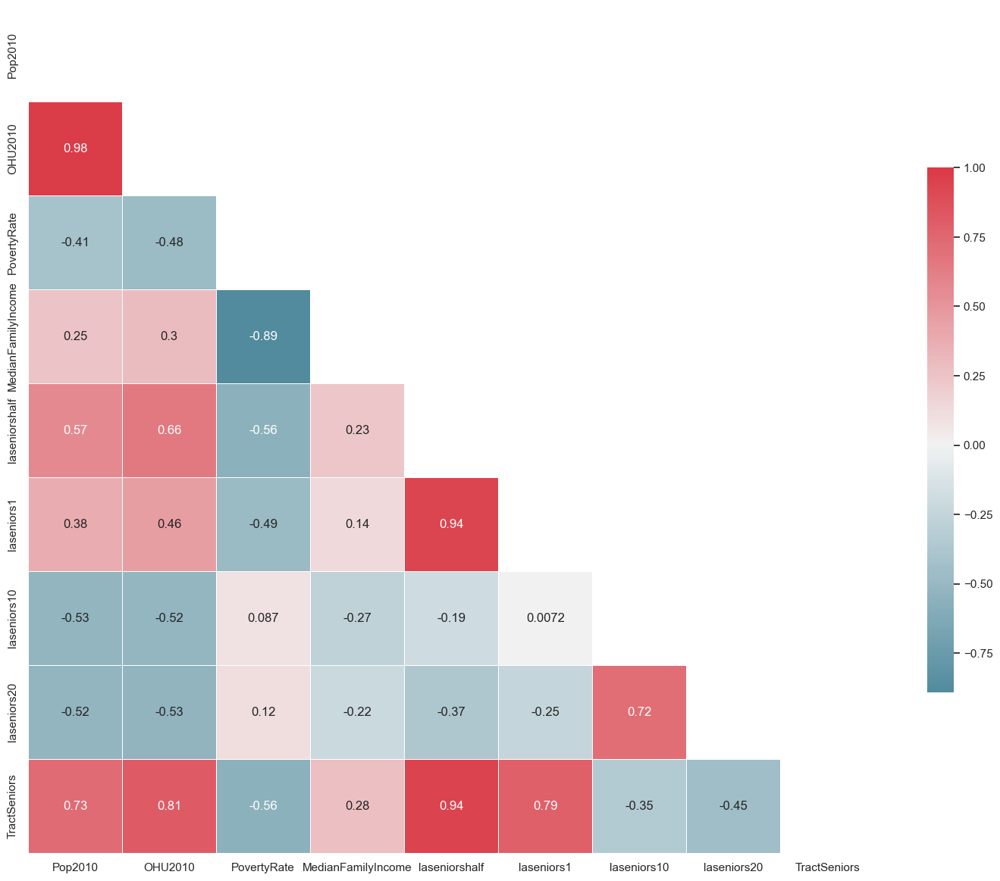

In [304]:
#Look at the correlation between the columns, using a heatmap
sns.set(style="white")
# Generate a mask for the upper triangle
mask = np.zeros_like(correlation.corr())
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)


### What we're looking at here:
- laseniorshalf, laseniors1, laseniors10, laseniors20 are all features of focus, so one will be the target variable. We're trying to figure out which of these to focus on (stakeholder question - where is the greatest need, in order to determine where to spend funds)
- Pop2010, OHU2010, PovertyRate, MMeidanFamilyIncome are all potential dependant variables.
#### A few things can be drawn from this:
1. Income and poverty rate may not give us the best high/low correlation to help with modeling.
2. Population & Owned Housing Units seem to be the best to use.
3. As the population goes down, the distance from a supermarket grows. (Makes sense, urban to rural) Levels off in the 10 & 20 mile buckets.
4. As the owned housing units go down, the same occurs. (Again, makes sense, urban to rural) Again, this leveles off in the higher distance buckets.

In [305]:
#Add the 'HUNVFlag', LATractsVehicle_20' colums to the 'food_target_sel' dataset
food_target_sel['HUNVFlag'] = food['HUNVFlag']
food_target_sel['LATractsVehicle_20'] = food['LATractsVehicle_20']
food_target_sel.head()

,Pop2010,OHU2010,PovertyRate,MedianFamilyIncome,laseniorshalf,laseniors1,laseniors10,laseniors20,TractSeniors,HUNVFlag,LATractsVehicle_20
0,1912,693,11.3,81250.0,221.0,219.0,0.0,0.0,221.0,0,0
1,2170,743,17.9,49000.0,214.0,127.0,0.0,0.0,214.0,0,0
2,3373,1256,15.0,62609.0,358.0,201.0,0.0,0.0,439.0,0,0
3,4386,1722,2.8,70607.0,767.0,237.0,0.0,0.0,904.0,0,0
4,10766,4082,15.2,96334.0,840.0,362.0,0.0,0.0,1126.0,1,1


In [306]:
#Get the correlation between the columns
correlation = food_target_sel.corr()
correlation

,Pop2010,OHU2010,PovertyRate,MedianFamilyIncome,laseniorshalf,laseniors1,laseniors10,laseniors20,TractSeniors,HUNVFlag,LATractsVehicle_20
Pop2010,1.000000,0.897393,-0.142212,0.126679,0.420123,0.292857,-0.060814,-0.038221,0.520575,0.136448,0.127331
OHU2010,0.897393,1.000000,-0.190677,0.166297,0.510192,0.340173,-0.049674,-0.034692,0.657663,0.188821,0.179597
PovertyRate,-0.142212,-0.190677,1.000000,-0.635930,-0.261135,-0.205479,-0.000009,0.014557,-0.243273,0.287641,0.286212
MedianFamilyIncome,0.126679,0.166297,-0.635930,1.000000,0.112493,0.050436,-0.082443,-0.033683,0.135470,-0.228259,-0.231033
laseniorshalf,0.420123,0.510192,-0.261135,0.112493,1.000000,0.828382,0.127544,0.034385,0.825387,0.232044,0.231404
laseniors1,0.292857,0.340173,-0.205479,0.050436,0.828382,1.000000,0.244450,0.071434,0.570219,0.114627,0.119771
laseniors10,-0.060814,-0.049674,-0.000009,-0.082443,0.127544,0.244450,1.000000,0.488691,0.040986,-0.019866,0.032042
laseniors20,-0.038221,-0.034692,0.014557,-0.033683,0.034385,0.071434,0.488691,1.000000,0.006931,-0.004827,0.093294
TractSeniors,0.520575,0.657663,-0.243273,0.135470,0.825387,0.570219,0.040986,0.006931,1.000000,0.164240,0.160169
HUNVFlag,0.136448,0.188821,0.287641,-0.228259,0.232044,0.114627,-0.019866,-0.004827,0.164240,1.000000,0.988339


<Axes: >

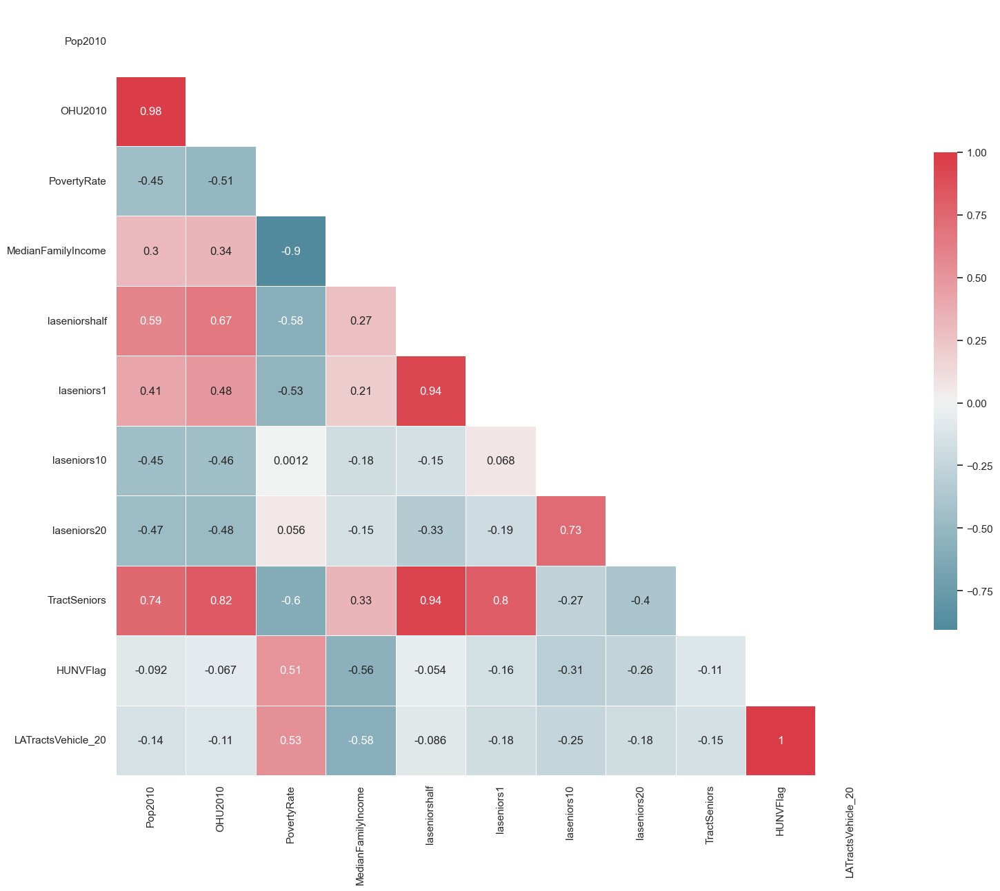

In [307]:
#Look at the correlation between the columns, using a heatmap
sns.set(style="white")
# Generate a mask for the upper triangle
mask = np.zeros_like(correlation.corr())
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

### When I add in the vehicle access information:
- There is not a strong correlation between our potential target variables and vehicle access.

## For our model, I'm going to use the following:
- 'laseniorshalf' as the basis for the target variable - Seniors that are more than 1/2 mile away from a store in populated areas
- Will use the total population 'Pop2010' and Owned Housing Units 'OHU2010' as predictors, along with racial demographic information from the 1/2 mile bucket/marker.
- We'll need to first, create our working dataset from the information gathered, then add a binary flag to represent the question posed by our stakeholders: "Based on the input, is this a good place to spend (in the 75 percentile)?"

## Create the dataset

In [308]:
#Create a new dataset from the food dataset that contains the following columns: 'Pop2010', 'OHU2010', 'laseniorshalf', 'lalowihalf', 'lawhitehalf', 'lablackhalf', 'laasianhalf', 'lanhopihalf', 'laaianhalf', 'laomultirhalf', 'lahisphalf'
food_df = food[['Pop2010', 'OHU2010', 'laseniorshalf', 'lalowihalf', 'lawhitehalf', 'lablackhalf', 'laasianhalf', 'lanhopihalf', 'laaianhalf', 'laomultirhalf', 'lahisphalf']]
food_df.head()

,Pop2010,OHU2010,laseniorshalf,lalowihalf,lawhitehalf,lablackhalf,laasianhalf,lanhopihalf,laaianhalf,laomultirhalf,lahisphalf
0,1912,693,221.0,467.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0
1,2170,743,214.0,962.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0
2,3373,1256,358.0,971.0,2177.0,554.0,10.0,1.0,10.0,105.0,78.0
3,4386,1722,767.0,893.0,3395.0,170.0,15.0,3.0,8.0,60.0,61.0
4,10766,4082,840.0,1719.0,6299.0,1001.0,209.0,5.0,38.0,227.0,277.0


In [309]:
#Replace missing values with zero - these are likely areas with no affected population
food_df = food_df.fillna(0)


In [310]:
#Add a new column 'target_var' to the food_df dataset that contains either a 0 or 1, where 'laseniorshalf' is in the 75th percentile
food_df['target_var'] = np.where(food_df['laseniorshalf'] > food_df['laseniorshalf'].quantile(0.75), 1, 0)
food_df.head()

,Pop2010,OHU2010,laseniorshalf,lalowihalf,lawhitehalf,lablackhalf,laasianhalf,lanhopihalf,laaianhalf,laomultirhalf,lahisphalf,target_var
0,1912,693,221.0,467.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,0
1,2170,743,214.0,962.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,0
2,3373,1256,358.0,971.0,2177.0,554.0,10.0,1.0,10.0,105.0,78.0,0
3,4386,1722,767.0,893.0,3395.0,170.0,15.0,3.0,8.0,60.0,61.0,1
4,10766,4082,840.0,1719.0,6299.0,1001.0,209.0,5.0,38.0,227.0,277.0,1


## 3. Bring in the models!


### Start with Logistic Regression
- Results are binary (yes/no in the 75 percentile)
- All features are numeric with missing values imputed (to zero)

In [311]:
#Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report


In [312]:
#Create a copy of the food_df dataset
food_df_copy_log_reg = food_df.copy()
#Create the target variable
y = food_df_copy_log_reg['target_var']
#Create the feature variables
X = food_df_copy_log_reg.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [313]:
#Create a Logistic Regression model
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)


/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [314]:
#Fit the model using the training data
log_reg.fit(X_train, y_train)


/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [315]:
#Validate the model using the testing data
y_pred = log_reg.predict(X_test)


In [316]:
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.7878676470588235

In [317]:
#Predict the outcome of the testing data
y_pred = log_reg.predict(X_test)
#Print the classification report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.90      0.81      0.85     16267
           1       0.56      0.73      0.63      5493

    accuracy                           0.79     21760
   macro avg       0.73      0.77      0.74     21760
weighted avg       0.81      0.79      0.80     21760



### LOGISTIC REGRESSION RESULTS - 79% Accuracy

### Next up: Decision Tree

In [318]:
#Create a copy of the food_df dataset
food_df_copy_dec_tree = food_df.copy()

In [319]:
#Import the necessary libraries
from sklearn.tree import DecisionTreeClassifier
#Create the target variable
y = food_df_copy_dec_tree['target_var']
#Create the feature variables
X = food_df_copy_dec_tree.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Create a Decision Tree model
dec_tree = DecisionTreeClassifier()
#Fit the model using the training data
dec_tree.fit(X_train, y_train)
#Validate the model using the testing data
y_pred = dec_tree.predict(X_test)
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

1.0

### Suspiciously perfect with a 100% score...
- Could be due to overfitting
### Move forward with: Random Forest

In [320]:
#Create a copy of the food_df dataset
food_df_copy_ran_for = food_df.copy()


In [321]:
#Import the necessary librararies
from sklearn.ensemble import RandomForestClassifier
#Create the target variable
y = food_df_copy_ran_for['target_var']
#Create the feature variables
X = food_df_copy_ran_for.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Create a Random Forest model
ran_for = RandomForestClassifier()
#Fit the model using the training data
ran_for.fit(X_train, y_train)
#Validate the model using the testing data
y_pred = ran_for.predict(X_test)
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

1.0

### Again, with a 100% score, could be overfitting
### Move forward with: Decision Tree w/ Cross Validation

In [322]:
#Import the necessary libraries
from sklearn.metrics import classification_report
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

In [323]:
#Create a copy of the food_df dataset
food_df_copy_bag = food_df.copy()
#Create the target variable
y = food_df_copy_bag['target_var']
#Create the feature variables
X = food_df_copy_bag.drop(['target_var'], axis=1)


In [324]:
#Importing some addditional libraraies for the model
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import balanced_accuracy_score

In [325]:
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [326]:
#Use the KFold function to split the data into folds
#First import additional libraries
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [327]:
#Define the model
kfold = KFold(n_splits=10) #1 fold for testing, 9 for training (Loops 10 times)

In [328]:
cart = DecisionTreeClassifier()
cart.fit(X_train, y_train)

DecisionTreeClassifier()

In [329]:
results = cross_val_score(cart, X, y, cv=kfold)

In [330]:
results

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [331]:
#Moving on to the calculation of the accuracy of the model
print('Decision Tree, Cross-Validation mean: %.4f' % results.mean())

Decision Tree, Cross-Validation mean: 1.0000


In [332]:
#Add the testing data to the model
y_pred = cart.predict(X_test)


In [333]:
#Evaluate the model based on the first iteration
#Look at the confusion matrix and the balanced accuracy score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import balanced_accuracy_score

In [334]:
confusion_matrix(y_test, y_pred)


array([[16267,     0],
       [    0,  5493]])

In [335]:
balanced_accuracy_score(y_test, y_pred)


1.0

### Concerned with 100% Accuracy.
- I believe that because I left the source of the target_var in the dataset ('laseniorshalf'), that it is using that to pull a 100% accuracy.
- Model is too accurate.
- Try pulling that column out and running the initial models again.

In [336]:
#Create a copy of the food_df dataset
food_df_wo_source = food_df.copy()
#Drop the 'laseniorshalf' column
food_df_wo_source = food_df_copy_bag.drop(['laseniorshalf'], axis=1)
food_df_wo_source.head()

,Pop2010,OHU2010,lalowihalf,lawhitehalf,lablackhalf,laasianhalf,lanhopihalf,laaianhalf,laomultirhalf,lahisphalf,target_var
0,1912,693,467.0,1622.0,217.0,14.0,0.0,14.0,45.0,44.0,0
1,2170,743,962.0,888.0,1217.0,5.0,0.0,5.0,55.0,75.0,0
2,3373,1256,971.0,2177.0,554.0,10.0,1.0,10.0,105.0,78.0,0
3,4386,1722,893.0,3395.0,170.0,15.0,3.0,8.0,60.0,61.0,1
4,10766,4082,1719.0,6299.0,1001.0,209.0,5.0,38.0,227.0,277.0,1


### Logistic Regression - Round 2

In [337]:
#Create a copy of the food_df dataset
food_df_wo_source_log_reg = food_df_wo_source.copy()
#Create the target variable
y = food_df_wo_source_log_reg['target_var']
#Create the feature variables
X = food_df_wo_source_log_reg.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [338]:
#Create a Logistic Regression model
log_reg = LogisticRegression()
#Fit the model using the training data
log_reg.fit(X_train, y_train)

/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [339]:
#Validate the model using the testing data
y_pred = log_reg.predict(X_test)


In [340]:
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.7483915441176471

In [341]:
#Predict the outcome of the testing data
y_pred = log_reg.predict(X_test)
#Print the classification report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.86      0.79      0.83     16267
           1       0.50      0.61      0.55      5493

    accuracy                           0.75     21760
   macro avg       0.68      0.70      0.69     21760
weighted avg       0.77      0.75      0.76     21760



### Logistic Regression Model - Dropped to 75% Accuracy

### Decision Tree

In [342]:
#Create a copy of the food_df_wo_source dataset
food_df_wo_source_dec_tree = food_df_wo_source.copy()
#Create the target variable
y = food_df_wo_source_dec_tree['target_var']
#Create the feature variables
X = food_df_wo_source_dec_tree.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Create a Decision Tree model
dec_tree = DecisionTreeClassifier()
#Fit the model using the training data
dec_tree.fit(X_train, y_train)
#Validate the model using the testing data
y_pred = dec_tree.predict(X_test)
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy



0.8354779411764706

### Decision Tree Results - 84%

### Random Forest
- See if the score improves

In [343]:
#Create a copy of the food_df_wo_source dataset
food_df_wo_source_ran_for = food_df_wo_source.copy()
#Create the target variable
y = food_df_wo_source_ran_for['target_var']
#Create the feature variables
X = food_df_wo_source_ran_for.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#Create a Random Forest model
ran_for = RandomForestClassifier()
#Fit the model using the training data
ran_for.fit(X_train, y_train)
#Validate the model using the testing data
y_pred = ran_for.predict(X_test)
#Score the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.8805606617647059

### Random Forest Results - 88%

### Decision Tree with K-Fold Cross Validation

In [344]:
#Create a copy of the food_df_wo_source dataset
food_df_wo_source_kfold = food_df_wo_source.copy()
#Create the target variable
y = food_df_wo_source_kfold['target_var']
#Create the feature variables
X = food_df_wo_source_kfold.drop(['target_var'], axis=1)
#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



In [345]:
#Use the KFold function to split the data into folds
#First import additional libraries
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [346]:
#Define the model
kfold = KFold(n_splits=10) #1 fold for testing, 9 for training (Loops 10 times)


In [347]:
#Create the model
cart = DecisionTreeClassifier()
cart.fit(X_train, y_train)

DecisionTreeClassifier()

In [348]:
#Get the results of the model
results = cross_val_score(cart, X, y, cv=kfold)
results

array([0.86793493, 0.84061768, 0.80890666, 0.82048807, 0.82296981,
       0.82531366, 0.8574383 , 0.83661933, 0.81442162, 0.80477044])

In [349]:
#Get the accuracy of the model
print('Decision Tree, Cross-Validation mean: %.4f' % results.mean())


Decision Tree, Cross-Validation mean: 0.8299


In [350]:
#Add the testing data to the model
y_pred = cart.predict(X_test)

In [351]:
#Evaluate the model based on the first iteration
#Look at the confusion matrix and the balanced accuracy score
confusion_matrix(y_test, y_pred)

array([[14444,  1823],
       [ 1780,  3713]])

In [352]:
balanced_accuracy_score(y_test, y_pred)

0.7819419174815908

### Decision Tree w/ K-Fold Cross Validation - 78%

### Bagging

In [353]:
#Impletment the Bagging Classifier
#Define the number of trees
n_trees = 100
#Define the model
model = BaggingClassifier(n_estimators=n_trees, random_state=7)
#Fit the model
model.fit(X_train, y_train)



BaggingClassifier(n_estimators=100, random_state=7)

In [354]:
#Cross validate the model
results = cross_val_score(model, X, y, cv=kfold)
results

array([0.90474221, 0.87191507, 0.85316421, 0.87508617, 0.86874397,
       0.87867089, 0.90224735, 0.88570247, 0.87894664, 0.86984696])

In [355]:
#Calculate the mean cross validation score
print('Bagging Classifier, Cross-Validation mean: %.4f' % results.mean())

Bagging Classifier, Cross-Validation mean: 0.8789


In [356]:
#Add the testing data to the model
y_pred = model.predict(X_test)


In [357]:
#Look at the confusion matrix
confusion_matrix(y_test, y_pred)

array([[15200,  1067],
       [ 1522,  3971]])

In [358]:
#Look at the balanced accuracy score
balanced_accuracy_score(y_test, y_pred)

0.8286635809620209

### Bagging Classifier Results - 82%

### Boosting
- Making the weak learners into strong learners

In [359]:
#Import the necessary libraries
from sklearn.ensemble import AdaBoostClassifier

In [360]:
#Set the parameters for the model
seed = 7
num_trees = 70

In [361]:
#Set the kfold function to 10 splits
kfold = model_selection.KFold(n_splits=10)

In [362]:
#Combine the 70 weak learners into a strong learner, by building the model
#Define the model
model = AdaBoostClassifier(n_estimators=num_trees, random_state=seed)
#Fit the model
model.fit(X_train, y_train)

/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoostClassifier(n_estimators=70, random_state=7)

In [363]:
#Cross validate the model
results = model_selection.cross_val_score(model, X, y, cv=kfold)
print('AdaBoost Classifier, Cross-Validation mean: %.4f' % results.mean())

/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/jasonohara/anaconda3/envs/Mod0/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be r

AdaBoost Classifier, Cross-Validation mean: 0.8622


In [364]:
#Look at the confusion matrix
confusion_matrix(y_test, y_pred)

array([[15200,  1067],
       [ 1522,  3971]])

In [365]:
#Look at the balanced accuracy score
balanced_accuracy_score(y_test, y_pred)

0.8286635809620209

### Boosting Results - 83%

### Final model - Stacking

In [366]:
#Import the necessary libraries
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.classifier import StackingClassifier

In [367]:
#Set the seed for reproducibility
np.random.seed(0)

In [368]:
#Create the sub-models
# create the sub models (4 base models) 
clf1 = KNeighborsClassifier(n_neighbors = 1)
clf1.fit(X_train, y_train)
clf2 = RandomForestClassifier(n_estimators = 10, random_state = 1)
clf2.fit(X_train, y_train)
clf3 = GaussianNB()
clf3.fit(X_train, y_train)
lr = LogisticRegression(multi_class = 'auto', solver = 'lbfgs', max_iter=1000)
lr.fit(X_train, y_train)

#Create the stacking model
sclf = StackingClassifier(
    classifiers = [clf1, clf2, clf3],
    meta_classifier = lr)
sclf.fit(X_train, y_train)
print()

In [369]:
#Evaluate the model using the kfold cross validation
kfold = model_selection.KFold(n_splits = 10)
results = model_selection.cross_val_score(sclf, X_train, y_train, cv = kfold)
print('Stacking, Cross-Validation mean: %.4f' % results.mean())

Stacking, Cross-Validation mean: 0.8406


In [370]:
#Look at the confusion matrix
confusion_matrix(y_test, y_pred)

array([[15200,  1067],
       [ 1522,  3971]])

In [371]:
#Look at the balanced accuracy score
balanced_accuracy_score(y_test, y_pred)

0.8286635809620209

### Stacking Results - 83%

# SUMMARY

## Strongest Model Appears To Be Random Forest at 88%